# 3D Microscopy Image Analysis

This notebook performs analysis on 3D microscopy images to extract critical information needed for our multi-model fusion approach. We'll analyze:

1. Image properties (dimensions, resolution, intensity distribution)
2. Acquisition parameters (viewing angles, PSF characteristics)
3. Shadow/occlusion patterns
4. Anisotropic resolution effects
5. Signal degradation with depth
6. View-specific artifacts

In [ ]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import mean_squared_error
from scipy import ndimage
from skimage import io, measure, filters, feature
import os
import glob
import h5py
import pandas as pd
from IPython.display import display
import re
import PIL

# Set up plotting parameters
plt.rcParams['figure.figsize'] = (12, 10)
plt.style.use('dark_background')

Found 6 angle view files
Could not extract angle from image_2_nucleus_angle.tif, defaulting to 0
Added pair: image_2_nucleus_angle.tif and image_2_nucleus_fused.tif with angle 0°
Could not extract angle from image_3_nucleus_angle.tif, defaulting to 0
Added pair: image_3_nucleus_angle.tif and image_3_nucleus_fused.tif with angle 0°
Could not extract angle from image_5_nucleus_angle.tif, defaulting to 0
Added pair: image_5_nucleus_angle.tif and image_5_nucleus_fused.tif with angle 0°
Could not extract angle from image_0_nucleus_angle.tif, defaulting to 0
Added pair: image_0_nucleus_angle.tif and image_0_nucleus_fused.tif with angle 0°
Could not extract angle from image_4_nucleus_angle.tif, defaulting to 0
Added pair: image_4_nucleus_angle.tif and image_4_nucleus_fused.tif with angle 0°
Could not extract angle from image_1_nucleus_angle.tif, defaulting to 0
Added pair: image_1_nucleus_angle.tif and image_1_nucleus_fused.tif with angle 0°
Could not extract angle from image_2_nucleus_angle.

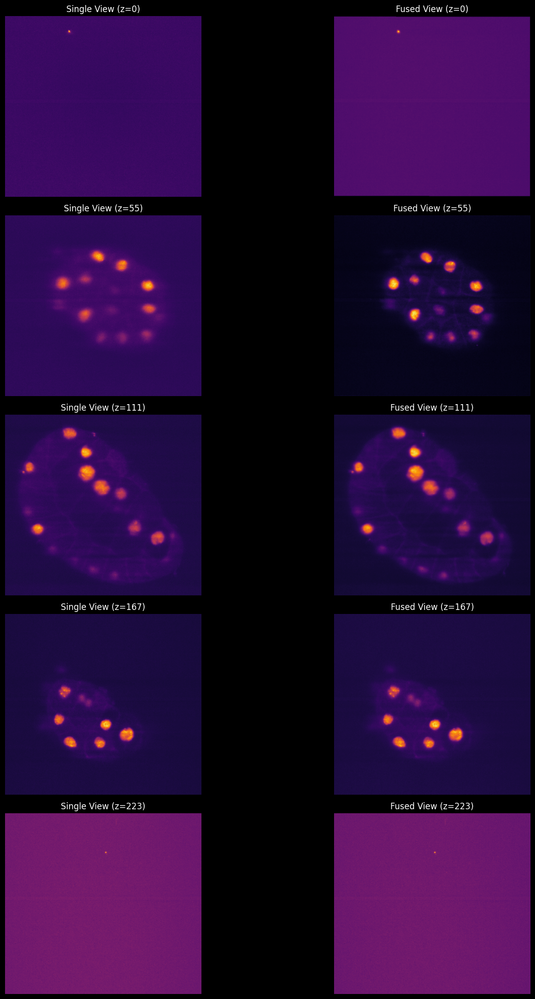

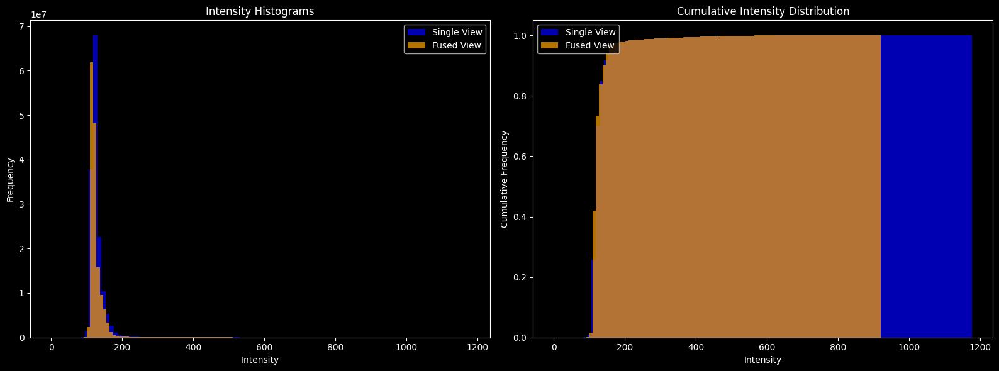


Intensity Statistics:
    Metric  Single View  Fused View
0      Min     0.000000    9.000000
1      Max  1178.000000  921.000000
2     Mean   130.768511  127.941896
3   Median   123.000000  120.000000
4  Std Dev    36.407872   34.365986

Shadow Statistics:
  percent_volume: 99.32864213446209
  mean_intensity_diff: 0.01956174149400457
  max_intensity_diff: 0.45585738539341747
  num_regions: 4171
  mean_region_size: 36463.87173339727
  largest_region_size: 152085667


In [10]:
import os
import glob
import re
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, measure, filters, feature
from scipy import ndimage
import h5py
import pandas as pd
from IPython.display import display

def extract_angle_from_filename(filename):
    """
    Extract acquisition angle from filename
    
    Args:
        filename: Filename to extract angle from
        
    Returns:
        angle: Extracted angle in degrees (or 0 if not found)
    """
    # Try to find a pattern like 'angle45' or 'angle_45'
    match = re.search(r'angle[_]?(\d+)', filename)
    if match:
        return int(match.group(1))
    
    # If filename contains 'angle' but no number after it, try to look elsewhere in the filename
    if 'angle' in filename.lower():
        # Look for numbers in the filename
        nums = re.findall(r'\d+', os.path.basename(filename))
        if nums:
            # If we have multiple numbers, make an educated guess
            parts = os.path.basename(filename).split('_')
            for part in parts:
                if 'angle' in part.lower():
                    # Look for a number near the 'angle' part
                    for p in parts[parts.index(part):]:
                        if p.isdigit():
                            return int(p)
    
        # Try to extract angle from the TIF file metadata if available
        try:
            from PIL import Image, TiffTags
            with Image.open(filename) as img:
                for tag, value in img.tag.items():
                    tag_name = TiffTags.TAGS.get(tag, tag)
                    if 'angle' in str(tag_name).lower() or 'angle' in str(value).lower():
                        nums = re.findall(r'\d+', str(value))
                        if nums:
                            return int(nums[0])
        except Exception as e:
            print(f"Error extracting angle from TIFF metadata: {e}")
    
    # Default to 0 if angle not found
    print(f"Could not extract angle from {os.path.basename(filename)}, defaulting to 0")
    return 0


def load_image_pair(single_view_path, fused_view_path):
    """
    Load a pair of 3D volumes (single view and fused view)
    
    Args:
        single_view_path: Path to single view .h5 or .tif file
        fused_view_path: Path to corresponding fused view file
        
    Returns:
        single_view: 3D numpy array
        fused_view: 3D numpy array
        metadata: Dictionary with metadata if available
    """
    metadata = {}
    
    # Handle different file formats
    if single_view_path.endswith('.h5'):
        with h5py.File(single_view_path, 'r') as f:
            # Assumes main dataset is named 'volume' - adjust as needed
            single_view = f['volume'][:]
            
            # Extract metadata if available
            for key in f.attrs.keys():
                metadata[key] = f.attrs[key]
    
    elif single_view_path.endswith(('.tif', '.tiff')):
        # For multi-page TIFF files
        single_view = io.imread(single_view_path)
        metadata['filename'] = os.path.basename(single_view_path)
        
        # Try to extract angle from filename
        angle = extract_angle_from_filename(single_view_path)
        metadata['angle'] = angle
    
    else:
        raise ValueError(f"Unsupported file format: {single_view_path}")
    
    # Load fused view with same approach
    if fused_view_path.endswith('.h5'):
        with h5py.File(fused_view_path, 'r') as f:
            fused_view = f['volume'][:]
    elif fused_view_path.endswith(('.tif', '.tiff')):
        fused_view = io.imread(fused_view_path)
        metadata['fused_filename'] = os.path.basename(fused_view_path)
    else:
        raise ValueError(f"Unsupported file format: {fused_view_path}")
    
    # Normalize if needed
    if single_view.ndim == 3 and fused_view.ndim == 3:
        # Good - these are already 3D volumes
        pass
    elif single_view.ndim == 4 and single_view.shape[-1] == 1:
        # Remove channel dimension if it's singleton
        single_view = single_view[..., 0]
    elif single_view.ndim == 4 and single_view.shape[-1] > 1:
        # For multi-channel data, use first channel or convert to grayscale
        print(f"Warning: Multi-channel data detected with {single_view.shape[-1]} channels. Using first channel.")
        single_view = single_view[..., 0]
    
    # Same for fused view
    if fused_view.ndim == 4 and fused_view.shape[-1] == 1:
        fused_view = fused_view[..., 0]
    elif fused_view.ndim == 4 and fused_view.shape[-1] > 1:
        print(f"Warning: Multi-channel data detected with {fused_view.shape[-1]} channels. Using first channel.")
        fused_view = fused_view[..., 0]
    
    return single_view, fused_view, metadata


def find_image_pairs(data_dir):
    """
    Find all matching angle and fused view pairs in a directory
    
    Args:
        data_dir: Directory containing image files
        
    Returns:
        List of (single_view_file, fused_view_file, angle) tuples
    """
    # Find all angle view files
    angle_files = glob.glob(os.path.join(data_dir, "*angle*.tif")) + \
                 glob.glob(os.path.join(data_dir, "*angle*.tiff"))
    print(f"Found {len(angle_files)} angle view files")
    
    # Create sample pairs dynamically
    sample_pairs = []
    for angle_file in angle_files:
        # Get base properties from filename
        basename = os.path.basename(angle_file)
        parts = basename.split('_')
        
        if len(parts) >= 3:
            # Extract image ID and sample type
            image_id = parts[1]
            sample_type = parts[2]
            
            # Find corresponding fused file
            fused_file = os.path.join(data_dir, f"image_{image_id}_{sample_type}_fused.tif")
            
            # If not found, try alternative extensions
            if not os.path.exists(fused_file):
                fused_file = os.path.join(data_dir, f"image_{image_id}_{sample_type}_fused.tiff")
            
            if os.path.exists(fused_file):
                # Extract angle from angle file
                angle = extract_angle_from_filename(angle_file)
                
                # Add to sample pairs
                sample_pairs.append((os.path.basename(angle_file), os.path.basename(fused_file), angle))
                print(f"Added pair: {os.path.basename(angle_file)} and {os.path.basename(fused_file)} with angle {angle}°")
    
    return sample_pairs


def visualize_slices(single_view, fused_view, z_indices=None):
    """
    Visualize slices from single and fused views side by side
    
    Args:
        single_view: 3D array of single view data
        fused_view: 3D array of fused view data
        z_indices: List of z-indices to visualize (if None, evenly spaced samples)
    """
    if z_indices is None:
        # Select 5 evenly spaced slices
        z_indices = np.linspace(0, min(single_view.shape[0], fused_view.shape[0])-1, 5, dtype=int)
    
    fig, axes = plt.subplots(len(z_indices), 2, figsize=(16, 4*len(z_indices)))
    
    for i, z in enumerate(z_indices):
        # Display single view slice
        axes[i, 0].imshow(single_view[z], cmap='inferno')
        axes[i, 0].set_title(f"Single View (z={z})")
        axes[i, 0].axis('off')
        
        # Display fused view slice
        axes[i, 1].imshow(fused_view[z], cmap='inferno')
        axes[i, 1].set_title(f"Fused View (z={z})")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()


def analyze_intensity_distribution(single_view, fused_view):
    """
    Analyze and compare intensity distributions of single and fused views
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Histograms
    axes[0].hist(single_view.ravel(), bins=100, alpha=0.7, label='Single View', color='blue')
    axes[0].hist(fused_view.ravel(), bins=100, alpha=0.7, label='Fused View', color='orange')
    axes[0].set_title('Intensity Histograms')
    axes[0].set_xlabel('Intensity')
    axes[0].set_ylabel('Frequency')
    axes[0].legend()
    
    # Cumulative distribution
    axes[1].hist(single_view.ravel(), bins=100, alpha=0.7, label='Single View', 
                 color='blue', cumulative=True, density=True)
    axes[1].hist(fused_view.ravel(), bins=100, alpha=0.7, label='Fused View', 
                 color='orange', cumulative=True, density=True)
    axes[1].set_title('Cumulative Intensity Distribution')
    axes[1].set_xlabel('Intensity')
    axes[1].set_ylabel('Cumulative Frequency')
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Basic statistics
    stats = pd.DataFrame({
        'Metric': ['Min', 'Max', 'Mean', 'Median', 'Std Dev'],
        'Single View': [single_view.min(), single_view.max(), 
                        single_view.mean(), np.median(single_view), single_view.std()],
        'Fused View': [fused_view.min(), fused_view.max(), 
                      fused_view.mean(), np.median(fused_view), fused_view.std()]
    })
    
    return stats


def identify_shadow_regions(single_view, fused_view, threshold_factor=0.3):
    """
    Identify shadow regions by comparing single view with fused view
    
    Args:
        single_view: 3D array of single view data
        fused_view: 3D array of fused view data
        threshold_factor: Factor to determine shadow threshold
        
    Returns:
        shadow_mask: Binary mask of shadow regions
        shadow_stats: Dictionary with statistics about shadow regions
    """
    # Normalize both volumes to [0, 1] if not already
    single_norm = (single_view - single_view.min()) / (single_view.max() - single_view.min() + 1e-8)
    fused_norm = (fused_view - fused_view.min()) / (fused_view.max() - fused_view.min() + 1e-8)
    
    # Compute intensity difference
    intensity_diff = fused_norm - single_norm
    
    # Create shadow mask where fused view has significantly higher intensity
    threshold = threshold_factor * np.std(intensity_diff)
    shadow_mask = intensity_diff > threshold
    
    # Compute shadow statistics
    shadow_stats = {
        'percent_volume': 100 * np.sum(shadow_mask) / shadow_mask.size,
        'mean_intensity_diff': np.mean(intensity_diff[shadow_mask]),
        'max_intensity_diff': np.max(intensity_diff)
    }
    
    # Label connected shadow regions
    labeled_shadows, num_regions = ndimage.label(shadow_mask)
    shadow_stats['num_regions'] = num_regions
    
    # Calculate sizes of shadow regions
    region_sizes = np.bincount(labeled_shadows.ravel())[1:] if num_regions > 0 else []
    shadow_stats['mean_region_size'] = np.mean(region_sizes) if len(region_sizes) > 0 else 0
    shadow_stats['largest_region_size'] = np.max(region_sizes) if len(region_sizes) > 0 else 0
    
    return shadow_mask, shadow_stats


def analyze_anisotropic_resolution(single_view, acquisition_angle):
    """
    Analyze anisotropic resolution by measuring edge sharpness in different directions
    """
    # Compute gradients in each direction
    grad_z = ndimage.sobel(single_view, axis=0)
    grad_y = ndimage.sobel(single_view, axis=1)
    grad_x = ndimage.sobel(single_view, axis=2)
    
    # Compute gradient magnitude
    grad_mag = np.sqrt(grad_z**2 + grad_y**2 + grad_x**2)
    
    # Get average gradient magnitude for each direction
    avg_grad_z = np.mean(np.abs(grad_z))
    avg_grad_y = np.mean(np.abs(grad_y))
    avg_grad_x = np.mean(np.abs(grad_x))
    
    # Compute anisotropy ratios
    xy_z_ratio = (avg_grad_x + avg_grad_y) / (2 * avg_grad_z)
    x_y_ratio = avg_grad_x / avg_grad_y
    
    # Display results
    print(f"Average gradient magnitude in X direction: {avg_grad_x:.6f}")
    print(f"Average gradient magnitude in Y direction: {avg_grad_y:.6f}")
    print(f"Average gradient magnitude in Z direction: {avg_grad_z:.6f}")
    print(f"XY-to-Z anisotropy ratio: {xy_z_ratio:.6f}")
    print(f"X-to-Y anisotropy ratio: {x_y_ratio:.6f}")
    
    # Return anisotropy stats
    return {
        'avg_grad_x': avg_grad_x,
        'avg_grad_y': avg_grad_y,
        'avg_grad_z': avg_grad_z,
        'xy_z_ratio': xy_z_ratio,
        'x_y_ratio': x_y_ratio
    }


def interactive_slice_viewer(volume, title="3D Volume"):
    """
    Create a simple interactive slice viewer for a 3D volume
    
    Args:
        volume: 3D numpy array
        title: Title for the plot
    """
    from ipywidgets import interact, IntSlider
    
    def view_slice(z=0):
        plt.figure(figsize=(10, 8))
        plt.imshow(volume[z], cmap='inferno')
        plt.title(f"{title} - z={z}")
        plt.colorbar(shrink=0.8)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    # Create interactive slider
    z_slider = IntSlider(min=0, max=volume.shape[0]-1, step=1, value=volume.shape[0]//2,
                        description='Z-slice:', continuous_update=False)
    
    # Display interactive widget
    interact(view_slice, z=z_slider)


def create_tensorflow_dataset(single_views, fused_views, angles, patch_size=(32, 32, 32), batch_size=4):
    """
    Create a TensorFlow dataset for training with patches
    
    Args:
        single_views: List of single view volumes
        fused_views: List of corresponding fused view volumes
        angles: List of acquisition angles (in degrees)
        patch_size: Tuple of (depth, height, width) for patches
        batch_size: Batch size for training
        
    Returns:
        train_dataset: TensorFlow dataset for training
        val_dataset: TensorFlow dataset for validation
    """
    import tensorflow as tf
    
    # Verify inputs
    assert len(single_views) == len(fused_views) == len(angles), "Lists must have the same length"
    
    # Function to extract random patches
    def extract_random_patches(single_view, fused_view, angle, num_patches=100):
        d, h, w = single_view.shape
        pd, ph, pw = patch_size
        
        # Ensure patch size is valid
        assert pd <= d and ph <= h and pw <= w, "Patch size too large for volume"
        
        # Maximum valid patch start indices
        max_d = d - pd
        max_h = h - ph
        max_w = w - pw
        
        patches_single = []
        patches_fused = []
        angles_repeated = []
        
        for _ in range(num_patches):
            # Random starting point for this patch
            start_d = np.random.randint(0, max_d + 1)
            start_h = np.random.randint(0, max_h + 1)
            start_w = np.random.randint(0, max_w + 1)
            
            # Extract patches
            patch_single = single_view[start_d:start_d+pd, start_h:start_h+ph, start_w:start_w+pw]
            patch_fused = fused_view[start_d:start_d+pd, start_h:start_h+ph, start_w:start_w+pw]
            
            # Normalize patches
            patch_single = (patch_single - patch_single.min()) / (patch_single.max() - patch_single.min() + 1e-8)
            patch_fused = (patch_fused - patch_fused.min()) / (patch_fused.max() - patch_fused.min() + 1e-8)
            
            # Add channel dimension
            patch_single = patch_single.reshape(pd, ph, pw, 1)
            patch_fused = patch_fused.reshape(pd, ph, pw, 1)
            
            # Convert angle to 3D vector for better conditioning
            angle_rad = np.radians(angle)
            angle_vector = np.array([np.sin(angle_rad), np.cos(angle_rad), 0.0])
            
            patches_single.append(patch_single)
            patches_fused.append(patch_fused)
            angles_repeated.append(angle_vector)
        
        return (
            np.array(patches_single, dtype=np.float32),
            np.array(angles_repeated, dtype=np.float32),
            np.array(patches_fused, dtype=np.float32)
        )
    
    # Extract patches from all volumes
    all_patches_single = []
    all_angles = []
    all_patches_fused = []
    
    for single_view, fused_view, angle in zip(single_views, fused_views, angles):
        patches_single, angles_repeated, patches_fused = extract_random_patches(single_view, fused_view, angle)
        
        all_patches_single.append(patches_single)
        all_angles.append(angles_repeated)
        all_patches_fused.append(patches_fused)
    
    # Combine all patches
    all_patches_single = np.vstack(all_patches_single)
    all_angles = np.vstack(all_angles)
    all_patches_fused = np.vstack(all_patches_fused)
    
    # Split into training and validation sets (80/20 split)
    num_samples = all_patches_single.shape[0]
    indices = np.random.permutation(num_samples)
    split_idx = int(num_samples * 0.8)
    
    train_indices = indices[:split_idx]
    val_indices = indices[split_idx:]
    
    train_single = all_patches_single[train_indices]
    train_angles = all_angles[train_indices]
    train_fused = all_patches_fused[train_indices]
    
    val_single = all_patches_single[val_indices]
    val_angles = all_angles[val_indices]
    val_fused = all_patches_fused[val_indices]
    
    # Create TensorFlow datasets
    train_dataset = tf.data.Dataset.from_tensor_slices((train_single, train_angles, train_fused))
    train_dataset = train_dataset.shuffle(buffer_size=512).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    val_dataset = tf.data.Dataset.from_tensor_slices((val_single, val_angles, val_fused))
    val_dataset = val_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    print(f"Created training dataset with {len(train_indices)} samples")
    print(f"Created validation dataset with {len(val_indices)} samples")
    
    return train_dataset, val_dataset


def prepare_pipeline_dataset(data_dir, sample_pairs, patch_size=(32, 32, 32), batch_size=4):
    """
    Prepare datasets for the entire pipeline
    
    Args:
        data_dir: Directory containing the data files
        sample_pairs: List of (single_view_file, fused_view_file, angle) tuples
        patch_size: Patch size for training
        batch_size: Batch size for training
        
    Returns:
        Dictionary containing datasets for each model
    """
    # Load all image pairs
    single_views = []
    fused_views = []
    angles = []
    
    for single_file, fused_file, angle in sample_pairs:
        try:
            single_path = os.path.join(data_dir, single_file)
            fused_path = os.path.join(data_dir, fused_file)
            
            single_view, fused_view, _ = load_image_pair(single_path, fused_path)
            single_views.append(single_view)
            fused_views.append(fused_view)
            angles.append(angle)
            
            print(f"Loaded view with angle {angle}°")
        except FileNotFoundError:
            print(f"Could not load files for angle {angle}°. Skipping.")
    
    if len(single_views) == 0:
        print("No image pairs loaded.")
        return None
    
    # Create datasets for Model 1 (Artifact Correction)
    print("\nCreating datasets for Model 1 (Artifact Correction)...")
    model1_train, model1_val = create_tensorflow_dataset(
        single_views, fused_views, angles, patch_size, batch_size
    )
    
    # For now, use the same datasets for all models
    # In practice, Model 2 would use outputs from Model 1, etc.
    model2_train, model2_val = model1_train, model1_val
    model3_train, model3_val = model1_train, model1_val
    
    return {
        'model1': {'train': model1_train, 'val': model1_val},
        'model2': {'train': model2_train, 'val': model2_val},
        'model3': {'train': model3_train, 'val': model3_val},
        'raw_data': {'single_views': single_views, 'fused_views': fused_views, 'angles': angles}
    }


if __name__ == "__main__":
    # Example usage
    data_dir = "test"
    
    # Find image pairs
    sample_pairs = find_image_pairs(data_dir)
    
    if sample_pairs:
        # Load first pair
        single_file = os.path.join(data_dir, sample_pairs[0][0])
        fused_file = os.path.join(data_dir, sample_pairs[0][1])
        angle = sample_pairs[0][2]
        
        # Load images
        try:
            single_view, fused_view, metadata = load_image_pair(single_file, fused_file)
            print(f"\nLoaded image pair:")
            print(f"Single view shape: {single_view.shape}")
            print(f"Fused view shape: {fused_view.shape}")
            print(f"Angle: {angle}°")
            
            # Show some basic analysis
            if hasattr(plt, 'show'):  # Check if running in a GUI environment
                # Display slices
                visualize_slices(single_view, fused_view)
                
                # Analyze intensity distribution
                stats = analyze_intensity_distribution(single_view, fused_view)
                print("\nIntensity Statistics:")
                print(stats)
                
                # Identify shadow regions
                shadow_mask, shadow_stats = identify_shadow_regions(single_view, fused_view)
                print("\nShadow Statistics:")
                for key, value in shadow_stats.items():
                    print(f"  {key}: {value}")
        except Exception as e:
            print(f"Error loading or analyzing images: {e}")
    else:
        print("No image pairs found in the directory.")

## 1. Load and Visualize Image Data

First, we'll load sample image pairs (single view and fused) to understand their basic properties.

In [9]:
from PIL import Image, TiffTags

In [ ]:
def extract_angle_from_filename(filename):
    """
    Extract acquisition angle from filename
    
    Args:
        filename: Filename to extract angle from
        
    Returns:
        angle: Extracted angle in degrees (or 0 if not found)
    """
    # Try to find a pattern like 'angle45' or 'angle_45'
    match = re.search(r'angle[_]?(\d+)', filename)
    if match:
        return int(match.group(1))
    
    # If filename contains 'angle' but no number after it, try to look elsewhere in the filename
    if 'angle' in filename.lower():
        # Look for numbers in the filename
        nums = re.findall(r'\d+', os.path.basename(filename))
        if nums:
            # If we have multiple numbers, make an educated guess
            parts = os.path.basename(filename).split('_')
            for part in parts:
                if 'angle' in part.lower():
                    # Look for a number near the 'angle' part
                    for p in parts[parts.index(part):]:
                        if p.isdigit():
                            return int(p)
    
        # Try to extract angle from the TIF file metadata if available
        try:
            with Image.open(filename) as img:
                for tag, value in img.tag.items():
                    tag_name = TiffTags.TAGS.get(tag, tag)
                    if 'angle' in str(tag_name).lower() or 'angle' in str(value).lower():
                        nums = re.findall(r'\d+', str(value))
                        if nums:
                            return int(nums[0])
        except Exception as e:
            print(f"Error extracting angle from TIFF metadata: {e}")
    
    # Default to 0 if angle not found
    print(f"Could not extract angle from {os.path.basename(filename)}, defaulting to 0")
    return 0

In [ ]:
def load_image_pair(single_view_path, fused_view_path):
    """
    Load a pair of 3D volumes (single view and fused view)
    
    Args:
        single_view_path: Path to single view .h5 or .tif file
        fused_view_path: Path to corresponding fused view file
        
    Returns:
        single_view: 3D numpy array
        fused_view: 3D numpy array
        metadata: Dictionary with metadata if available
    """
    metadata = {}
    
    # Handle different file formats
    if single_view_path.endswith('.h5'):
        with h5py.File(single_view_path, 'r') as f:
            # Assumes main dataset is named 'volume' - adjust as needed
            single_view = f['volume'][:]
            
            # Extract metadata if available
            for key in f.attrs.keys():
                metadata[key] = f.attrs[key]
    
    elif single_view_path.endswith(('.tif', '.tiff')):
        # For multi-page TIFF files
        single_view = io.imread(single_view_path)
        metadata['filename'] = os.path.basename(single_view_path)
        
        # Try to extract angle from filename
        angle = extract_angle_from_filename(single_view_path)
        metadata['angle'] = angle
    
    else:
        raise ValueError(f"Unsupported file format: {single_view_path}")
    
    # Load fused view with same approach
    if fused_view_path.endswith('.h5'):
        with h5py.File(fused_view_path, 'r') as f:
            fused_view = f['volume'][:]
    elif fused_view_path.endswith(('.tif', '.tiff')):
        fused_view = io.imread(fused_view_path)
        metadata['fused_filename'] = os.path.basename(fused_view_path)
    else:
        raise ValueError(f"Unsupported file format: {fused_view_path}")
    
    # Normalize if needed
    if single_view.ndim == 3 and fused_view.ndim == 3:
        # Good - these are already 3D volumes
        pass
    elif single_view.ndim == 4 and single_view.shape[-1] == 1:
        # Remove channel dimension if it's singleton
        single_view = single_view[..., 0]
    elif single_view.ndim == 4 and single_view.shape[-1] > 1:
        # For multi-channel data, use first channel or convert to grayscale
        print(f"Warning: Multi-channel data detected with {single_view.shape[-1]} channels. Using first channel.")
        single_view = single_view[..., 0]
    
    # Same for fused view
    if fused_view.ndim == 4 and fused_view.shape[-1] == 1:
        fused_view = fused_view[..., 0]
    elif fused_view.ndim == 4 and fused_view.shape[-1] > 1:
        print(f"Warning: Multi-channel data detected with {fused_view.shape[-1]} channels. Using first channel.")
        fused_view = fused_view[..., 0]
    
    return single_view, fused_view, metadata


def find_image_pairs(data_dir):
    """
    Find all matching angle and fused view pairs in a directory
    
    Args:
        data_dir: Directory containing image files
        
    Returns:
        List of (single_view_file, fused_view_file, angle) tuples
    """
    # Find all angle view files
    angle_files = glob.glob(os.path.join(data_dir, "*angle*.tif")) + \
                 glob.glob(os.path.join(data_dir, "*angle*.tiff"))
    print(f"Found {len(angle_files)} angle view files")
    
    # Create sample pairs dynamically
    sample_pairs = []
    for angle_file in angle_files:
        # Get base properties from filename
        basename = os.path.basename(angle_file)
        parts = basename.split('_')
        
        if len(parts) >= 3:
            # Extract image ID and sample type
            image_id = parts[1]
            sample_type = parts[2]
            
            # Find corresponding fused file
            fused_file = os.path.join(data_dir, f"image_{image_id}_{sample_type}_fused.tif")
            
            # If not found, try alternative extensions
            if not os.path.exists(fused_file):
                fused_file = os.path.join(data_dir, f"image_{image_id}_{sample_type}_fused.tiff")
            
            if os.path.exists(fused_file):
                # Extract angle from angle file
                angle = extract_angle_from_filename(angle_file)
                
                # Add to sample pairs
                sample_pairs.append((os.path.basename(angle_file), os.path.basename(fused_file), angle))
                print(f"Added pair: {os.path.basename(angle_file)} and {os.path.basename(fused_file)} with angle {angle}°")
    
    return sample_pairs

In [ ]:
# Path to your data - adjust as needed
data_dir = "test"
sample_pairs = [
    # List of (single_view_file, fused_view_file, angle) tuples
    ("sample1_angle45.h5", "sample1_fused.h5", 45),
    ("sample2_angle90.h5", "sample2_fused.h5", 90),
    # Add more pairs as needed
]

# Load first sample pair for analysis
single_view_path = os.path.join(data_dir, sample_pairs[0][0])
fused_view_path = os.path.join(data_dir, sample_pairs[0][1])
acquisition_angle = sample_pairs[0][2]

try:
    single_view, fused_view, metadata = load_image_pair(single_view_path, fused_view_path)
    print(f"Successfully loaded image pair!")
    print(f"Single view shape: {single_view.shape}")
    print(f"Fused view shape: {fused_view.shape}")
    print(f"Acquisition angle: {acquisition_angle} degrees")
    
    # Display metadata if available
    if metadata:
        print("\nMetadata:")
        for key, value in metadata.items():
            print(f"  {key}: {value}")
except FileNotFoundError:
    print("Sample files not found. Please adjust the file paths.")

## 2. Visualize Slices from Both Volumes

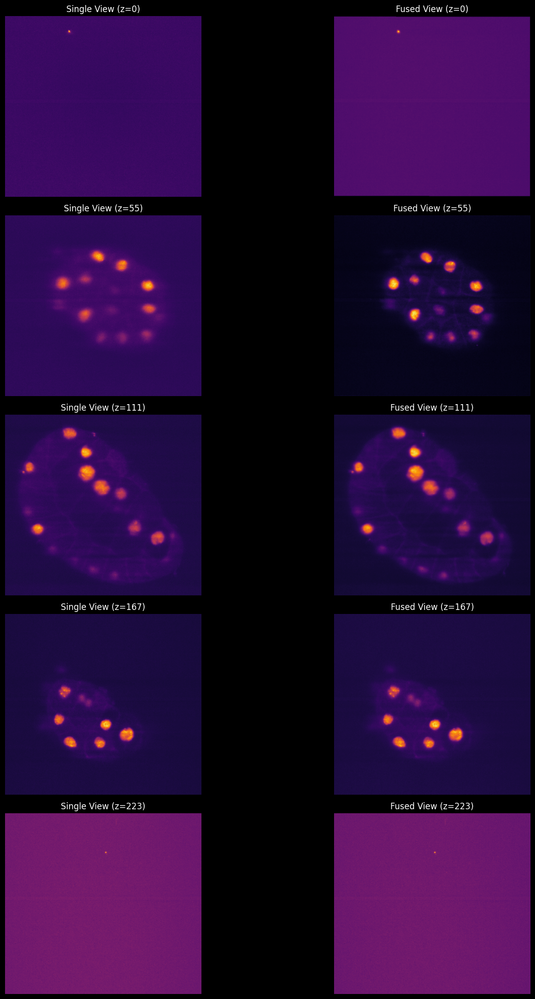

In [20]:
def visualize_slices(single_view, fused_view, z_indices=None):
    """
    Visualize slices from single and fused views side by side
    
    Args:
        single_view: 3D array of single view data
        fused_view: 3D array of fused view data
        z_indices: List of z-indices to visualize (if None, evenly spaced samples)
    """
    if z_indices is None:
        # Select 5 evenly spaced slices
        z_indices = np.linspace(0, min(single_view.shape[0], fused_view.shape[0])-1, 5, dtype=int)
    
    fig, axes = plt.subplots(len(z_indices), 2, figsize=(16, 4*len(z_indices)))
    
    for i, z in enumerate(z_indices):
        # Display single view slice
        axes[i, 0].imshow(single_view[z], cmap='inferno')
        axes[i, 0].set_title(f"Single View (z={z})")
        axes[i, 0].axis('off')
        
        # Display fused view slice
        axes[i, 1].imshow(fused_view[z], cmap='inferno')
        axes[i, 1].set_title(f"Fused View (z={z})")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualize slices if data was loaded successfully
try:
    visualize_slices(single_view, fused_view)
except NameError:
    print("Image data not available. Please load the data first.")

## 3. Analyze Intensity Distributions

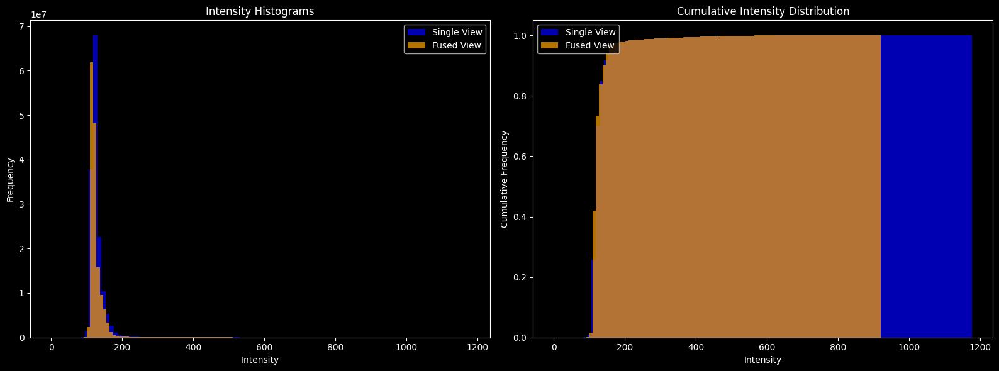

,Metric,Single View,Fused View
0,Min,0.000000,9.000000
1,Max,1178.000000,921.000000
2,Mean,130.768511,127.941896
3,Median,123.000000,120.000000
4,Std Dev,36.407872,34.365986


In [21]:
def analyze_intensity_distribution(single_view, fused_view):
    """
    Analyze and compare intensity distributions of single and fused views
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Histograms
    axes[0].hist(single_view.ravel(), bins=100, alpha=0.7, label='Single View', color='blue')
    axes[0].hist(fused_view.ravel(), bins=100, alpha=0.7, label='Fused View', color='orange')
    axes[0].set_title('Intensity Histograms')
    axes[0].set_xlabel('Intensity')
    axes[0].set_ylabel('Frequency')
    axes[0].legend()
    
    # Cumulative distribution
    axes[1].hist(single_view.ravel(), bins=100, alpha=0.7, label='Single View', 
                 color='blue', cumulative=True, density=True)
    axes[1].hist(fused_view.ravel(), bins=100, alpha=0.7, label='Fused View', 
                 color='orange', cumulative=True, density=True)
    axes[1].set_title('Cumulative Intensity Distribution')
    axes[1].set_xlabel('Intensity')
    axes[1].set_ylabel('Cumulative Frequency')
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Basic statistics
    stats = pd.DataFrame({
        'Metric': ['Min', 'Max', 'Mean', 'Median', 'Std Dev'],
        'Single View': [single_view.min(), single_view.max(), 
                        single_view.mean(), np.median(single_view), single_view.std()],
        'Fused View': [fused_view.min(), fused_view.max(), 
                      fused_view.mean(), np.median(fused_view), fused_view.std()]
    })
    
    display(stats)

try:
    analyze_intensity_distribution(single_view, fused_view)
except NameError:
    print("Image data not available. Please load the data first.")

## 4. Analyze Shadow Regions and Occlusions

Now we'll identify and analyze shadow regions that are specific to the acquisition angle.

In [22]:
def identify_shadow_regions(single_view, fused_view, threshold_factor=0.3):
    """
    Identify shadow regions by comparing single view with fused view
    
    Args:
        single_view: 3D array of single view data
        fused_view: 3D array of fused view data
        threshold_factor: Factor to determine shadow threshold
        
    Returns:
        shadow_mask: Binary mask of shadow regions
        shadow_stats: Dictionary with statistics about shadow regions
    """
    # Normalize both volumes to [0, 1] if not already
    single_norm = (single_view - single_view.min()) / (single_view.max() - single_view.min() + 1e-8)
    fused_norm = (fused_view - fused_view.min()) / (fused_view.max() - fused_view.min() + 1e-8)
    
    # Compute intensity difference
    intensity_diff = fused_norm - single_norm
    
    # Create shadow mask where fused view has significantly higher intensity
    threshold = threshold_factor * np.std(intensity_diff)
    shadow_mask = intensity_diff > threshold
    
    # Compute shadow statistics
    shadow_stats = {
        'percent_volume': 100 * np.sum(shadow_mask) / shadow_mask.size,
        'mean_intensity_diff': np.mean(intensity_diff[shadow_mask]),
        'max_intensity_diff': np.max(intensity_diff)
    }
    
    # Label connected shadow regions
    labeled_shadows, num_regions = ndimage.label(shadow_mask)
    shadow_stats['num_regions'] = num_regions
    
    # Calculate sizes of shadow regions
    region_sizes = np.bincount(labeled_shadows.ravel())[1:] if num_regions > 0 else []
    shadow_stats['mean_region_size'] = np.mean(region_sizes) if region_sizes.size > 0 else 0
    shadow_stats['largest_region_size'] = np.max(region_sizes) if region_sizes.size > 0 else 0
    
    return shadow_mask, shadow_stats

Shadow Region Statistics:
  percent_volume: 99.32864213446209
  mean_intensity_diff: 0.01956174149400457
  max_intensity_diff: 0.45585738539341747
  num_regions: 4171
  mean_region_size: 36463.87173339727
  largest_region_size: 152085667


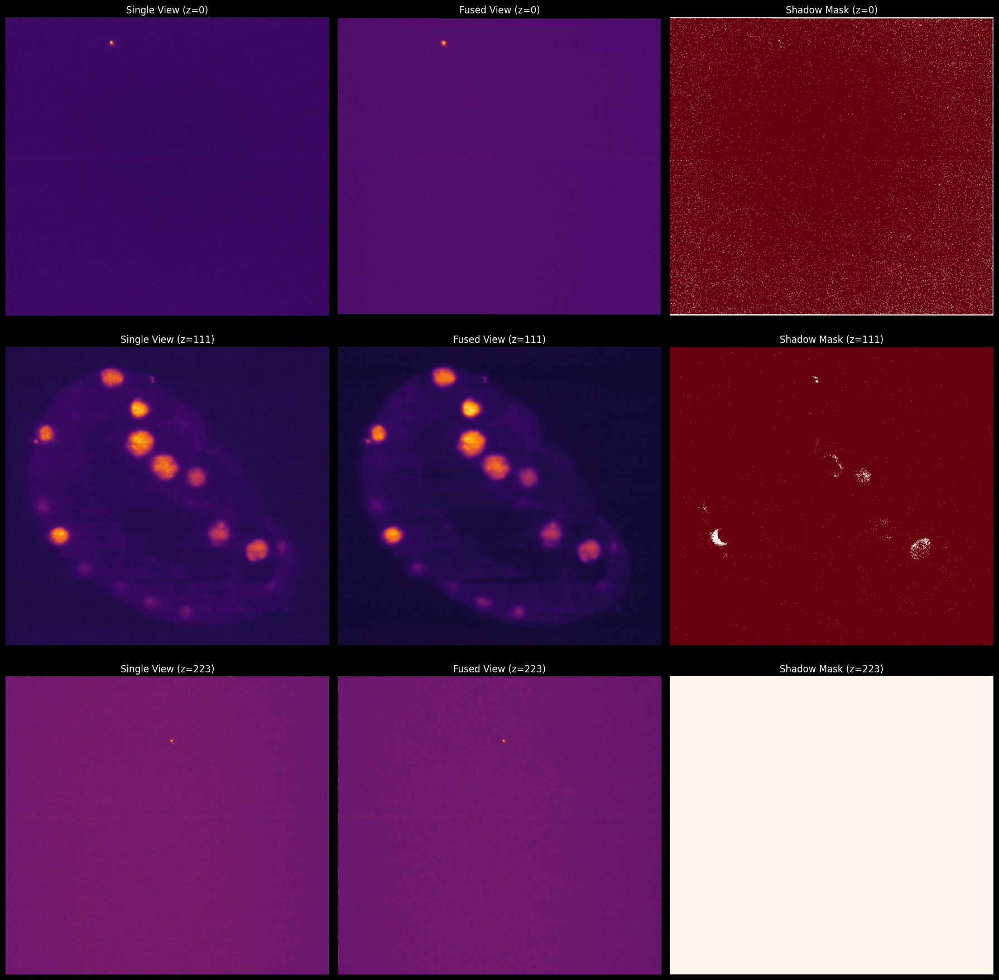

In [29]:
try:
    shadow_mask, shadow_stats = identify_shadow_regions(single_view, fused_view)
    
    # Display shadow statistics
    print("Shadow Region Statistics:")
    for key, value in shadow_stats.items():
        print(f"  {key}: {value}")
    
    # Visualize shadow regions in a few slices
    z_indices = np.linspace(0, shadow_mask.shape[0]-1, 3, dtype=int)
    
    fig, axes = plt.subplots(len(z_indices), 3, figsize=(18, 6*len(z_indices)))
    
    for i, z in enumerate(z_indices):
        # Single view
        axes[i, 0].imshow(single_view[z], cmap='inferno')
        axes[i, 0].set_title(f"Single View (z={z})")
        axes[i, 0].axis('off')
        
        # Fused view
        axes[i, 1].imshow(fused_view[z], cmap='inferno')
        axes[i, 1].set_title(f"Fused View (z={z})")
        axes[i, 1].axis('off')
        
        # Shadow mask
        axes[i, 2].imshow(shadow_mask[z], cmap='Reds')
        axes[i, 2].set_title(f"Shadow Mask (z={z})")
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
except NameError:
    print("Image data not available. Please load the data first.")

In [33]:
acquisition_angle = 0

## 5. Analyze Anisotropic Resolution

Next, we'll evaluate the anisotropic resolution characteristics by comparing edge sharpness in different directions.

Average gradient magnitude in X direction: 32606.742845
Average gradient magnitude in Y direction: 32576.900821
Average gradient magnitude in Z direction: 32196.929816
XY-to-Z anisotropy ratio: 1.012265
X-to-Y anisotropy ratio: 1.000916


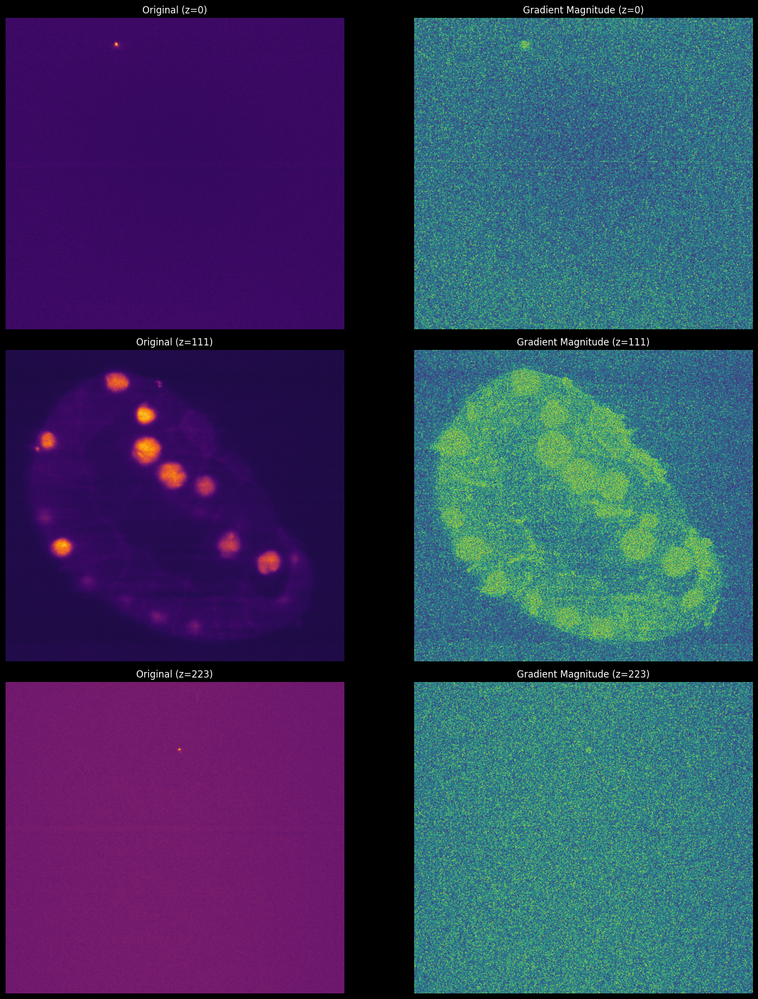

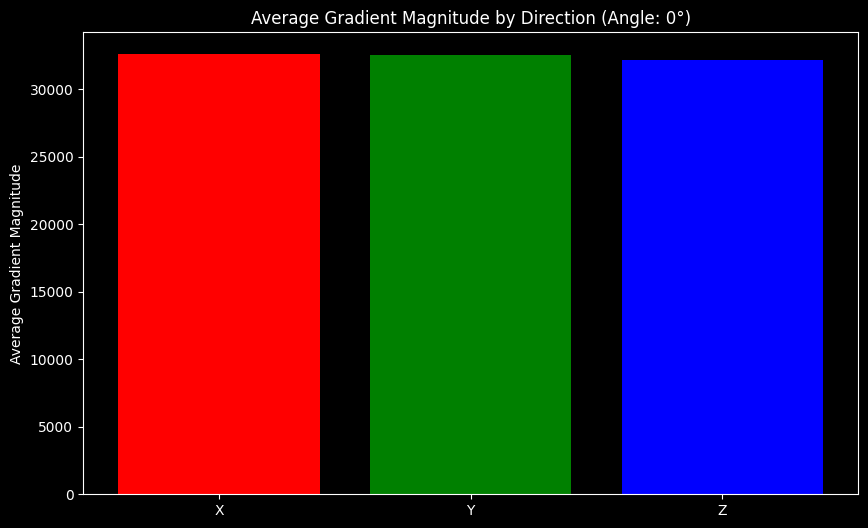

In [34]:
def analyze_anisotropic_resolution(single_view, acquisition_angle):
    """
    Analyze anisotropic resolution by measuring edge sharpness in different directions
    """
    # Compute gradients in each direction
    grad_z = ndimage.sobel(single_view, axis=0)
    grad_y = ndimage.sobel(single_view, axis=1)
    grad_x = ndimage.sobel(single_view, axis=2)
    
    # Compute gradient magnitude
    grad_mag = np.sqrt(grad_z**2 + grad_y**2 + grad_x**2)
    
    # Get average gradient magnitude for each direction
    avg_grad_z = np.mean(np.abs(grad_z))
    avg_grad_y = np.mean(np.abs(grad_y))
    avg_grad_x = np.mean(np.abs(grad_x))
    
    # Compute anisotropy ratios
    xy_z_ratio = (avg_grad_x + avg_grad_y) / (2 * avg_grad_z)
    x_y_ratio = avg_grad_x / avg_grad_y
    
    # Display results
    print(f"Average gradient magnitude in X direction: {avg_grad_x:.6f}")
    print(f"Average gradient magnitude in Y direction: {avg_grad_y:.6f}")
    print(f"Average gradient magnitude in Z direction: {avg_grad_z:.6f}")
    print(f"XY-to-Z anisotropy ratio: {xy_z_ratio:.6f}")
    print(f"X-to-Y anisotropy ratio: {x_y_ratio:.6f}")
    
    # Visualize gradient magnitude in different slices
    z_indices = np.linspace(0, grad_mag.shape[0]-1, 3, dtype=int)
    
    fig, axes = plt.subplots(len(z_indices), 2, figsize=(16, 6*len(z_indices)))
    
    for i, z in enumerate(z_indices):
        # Original slice
        axes[i, 0].imshow(single_view[z], cmap='inferno')
        axes[i, 0].set_title(f"Original (z={z})")
        axes[i, 0].axis('off')
        
        # Gradient magnitude
        axes[i, 1].imshow(grad_mag[z], cmap='viridis')
        axes[i, 1].set_title(f"Gradient Magnitude (z={z})")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Plot gradient magnitudes in all directions
    directions = ['X', 'Y', 'Z']
    values = [avg_grad_x, avg_grad_y, avg_grad_z]
    
    plt.figure(figsize=(10, 6))
    plt.bar(directions, values, color=['red', 'green', 'blue'])
    plt.title(f"Average Gradient Magnitude by Direction (Angle: {acquisition_angle}°)")
    plt.ylabel('Average Gradient Magnitude')
    plt.show()
    
    return {
        'avg_grad_x': avg_grad_x,
        'avg_grad_y': avg_grad_y,
        'avg_grad_z': avg_grad_z,
        'xy_z_ratio': xy_z_ratio,
        'x_y_ratio': x_y_ratio
    }

try:
    anisotropy_stats = analyze_anisotropic_resolution(single_view, acquisition_angle)
except NameError:
    print("Image data not available. Please load the data first.")

## 6. Analyze Signal Degradation with Depth

Next, we'll analyze how signal quality changes with depth in the single view volume.

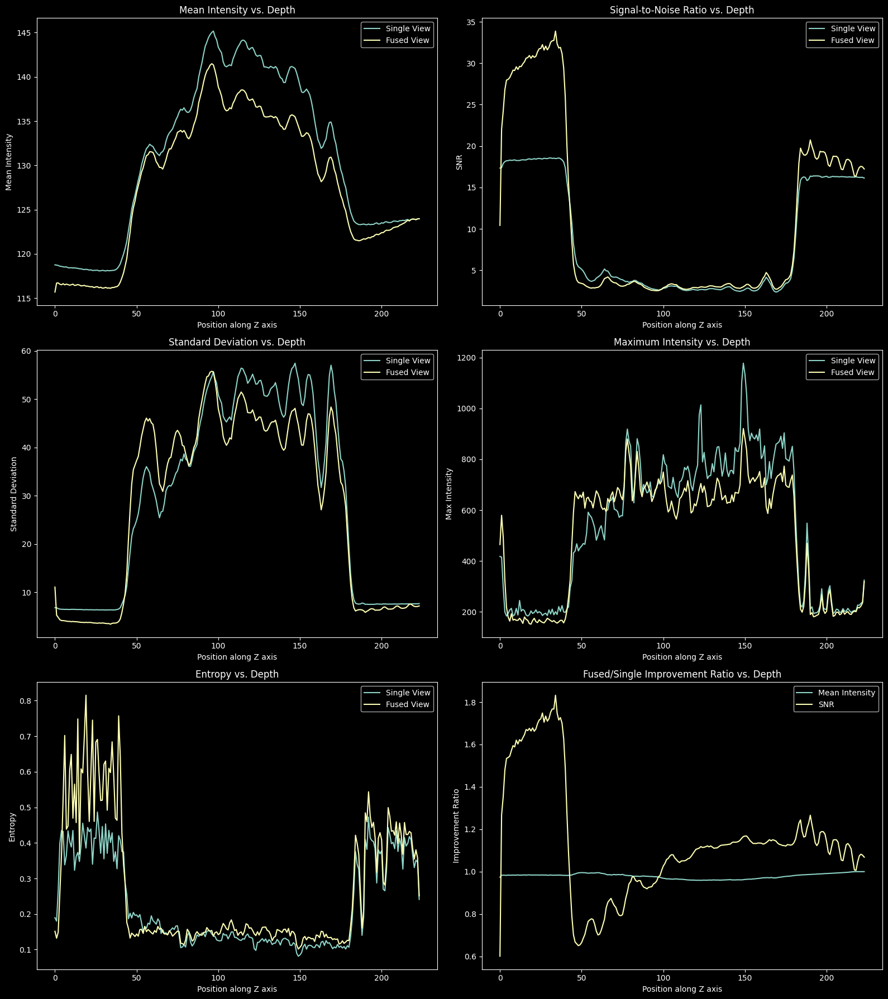

Signal Degradation Statistics:
  mean_degradation_rate: 0.029674285337425766
  snr_degradation_rate: -0.013079367430737922
  max_improvement_ratio: 1.0000650415629997
  mean_improvement_ratio: 0.9789859357064482
  primary_axis: Z


In [35]:
def analyze_signal_degradation(single_view, fused_view, acquisition_angle):
    """
    Analyze how signal degrades with depth in the single view volume
    """
    # Get dimensions
    depth, height, width = single_view.shape
    
    # Determine primary axis based on acquisition angle
    # This is a simple approximation - in reality, the relationship 
    # between acquisition angle and depth axis is more complex
    primary_axis = 0  # Default to z-axis
    if 45 <= acquisition_angle < 135 or 225 <= acquisition_angle < 315:
        primary_axis = 1  # y-axis
    elif 135 <= acquisition_angle < 225 or 315 <= acquisition_angle < 360:
        primary_axis = 2  # x-axis
    
    # Functions to compute metrics at each depth
    def compute_metrics_along_axis(volume, axis):
        slices = []
        for i in range(volume.shape[axis]):
            if axis == 0:
                slice_data = volume[i, :, :]
            elif axis == 1:
                slice_data = volume[:, i, :]
            else:  # axis == 2
                slice_data = volume[:, :, i]
            
            # Compute metrics for this slice
            metrics = {
                'mean': np.mean(slice_data),
                'std': np.std(slice_data),
                'snr': np.mean(slice_data) / np.std(slice_data) if np.std(slice_data) > 0 else 0,
                'max': np.max(slice_data),
                'entropy': -np.sum(np.histogram(slice_data, bins=20, density=True)[0] * 
                                  np.log(np.histogram(slice_data, bins=20, density=True)[0] + 1e-10))
            }
            slices.append(metrics)
        
        return pd.DataFrame(slices)
    
    # Compute metrics for both volumes
    single_view_metrics = compute_metrics_along_axis(single_view, primary_axis)
    fused_view_metrics = compute_metrics_along_axis(fused_view, primary_axis)
    
    # Calculate ratio of fused to single for each metric
    ratio_metrics = fused_view_metrics / single_view_metrics
    
    # Plot metrics
    fig, axes = plt.subplots(3, 2, figsize=(16, 18))
    
    # Mean intensity
    axes[0, 0].plot(single_view_metrics['mean'], label='Single View')
    axes[0, 0].plot(fused_view_metrics['mean'], label='Fused View')
    axes[0, 0].set_title('Mean Intensity vs. Depth')
    axes[0, 0].set_xlabel(f'Position along {["Z", "Y", "X"][primary_axis]} axis')
    axes[0, 0].set_ylabel('Mean Intensity')
    axes[0, 0].legend()
    
    # SNR
    axes[0, 1].plot(single_view_metrics['snr'], label='Single View')
    axes[0, 1].plot(fused_view_metrics['snr'], label='Fused View')
    axes[0, 1].set_title('Signal-to-Noise Ratio vs. Depth')
    axes[0, 1].set_xlabel(f'Position along {["Z", "Y", "X"][primary_axis]} axis')
    axes[0, 1].set_ylabel('SNR')
    axes[0, 1].legend()
    
    # Standard deviation
    axes[1, 0].plot(single_view_metrics['std'], label='Single View')
    axes[1, 0].plot(fused_view_metrics['std'], label='Fused View')
    axes[1, 0].set_title('Standard Deviation vs. Depth')
    axes[1, 0].set_xlabel(f'Position along {["Z", "Y", "X"][primary_axis]} axis')
    axes[1, 0].set_ylabel('Standard Deviation')
    axes[1, 0].legend()
    
    # Max intensity
    axes[1, 1].plot(single_view_metrics['max'], label='Single View')
    axes[1, 1].plot(fused_view_metrics['max'], label='Fused View')
    axes[1, 1].set_title('Maximum Intensity vs. Depth')
    axes[1, 1].set_xlabel(f'Position along {["Z", "Y", "X"][primary_axis]} axis')
    axes[1, 1].set_ylabel('Max Intensity')
    axes[1, 1].legend()
    
    # Entropy
    axes[2, 0].plot(single_view_metrics['entropy'], label='Single View')
    axes[2, 0].plot(fused_view_metrics['entropy'], label='Fused View')
    axes[2, 0].set_title('Entropy vs. Depth')
    axes[2, 0].set_xlabel(f'Position along {["Z", "Y", "X"][primary_axis]} axis')
    axes[2, 0].set_ylabel('Entropy')
    axes[2, 0].legend()
    
    # Improvement ratio
    axes[2, 1].plot(ratio_metrics['mean'], label='Mean Intensity')
    axes[2, 1].plot(ratio_metrics['snr'], label='SNR')
    axes[2, 1].set_title('Fused/Single Improvement Ratio vs. Depth')
    axes[2, 1].set_xlabel(f'Position along {["Z", "Y", "X"][primary_axis]} axis')
    axes[2, 1].set_ylabel('Improvement Ratio')
    axes[2, 1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Return statistics on signal degradation
    degradation_stats = {
        'mean_degradation_rate': np.polyfit(range(len(single_view_metrics)), single_view_metrics['mean'], 1)[0],
        'snr_degradation_rate': np.polyfit(range(len(single_view_metrics)), single_view_metrics['snr'], 1)[0],
        'max_improvement_ratio': np.max(ratio_metrics['mean']),
        'mean_improvement_ratio': np.mean(ratio_metrics['mean']),
        'primary_axis': ["Z", "Y", "X"][primary_axis]
    }
    
    return degradation_stats

try:
    degradation_stats = analyze_signal_degradation(single_view, fused_view, acquisition_angle)
    
    # Display degradation statistics
    print("Signal Degradation Statistics:")
    for key, value in degradation_stats.items():
        print(f"  {key}: {value}")
except NameError:
    print("Image data not available. Please load the data first.")

## 7. Analyze View-Specific Artifacts

Now we'll identify and characterize artifacts that are specific to the acquisition angle.

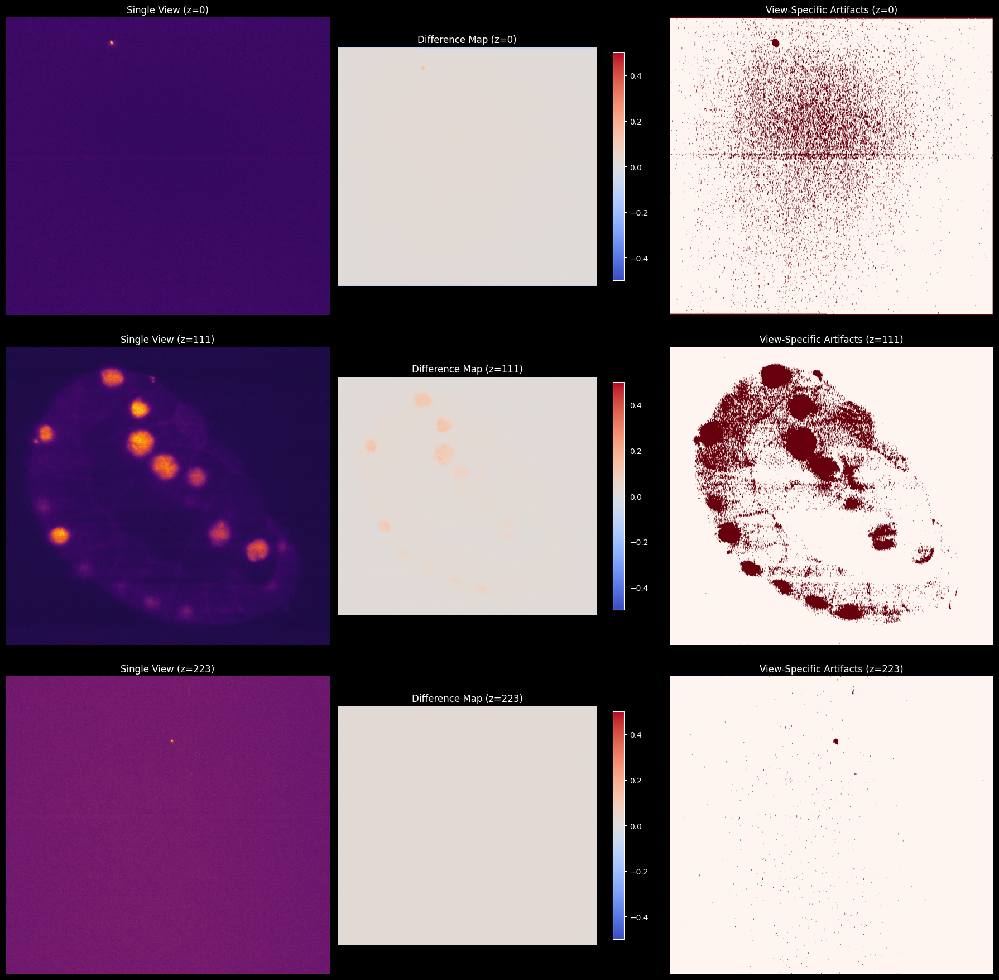

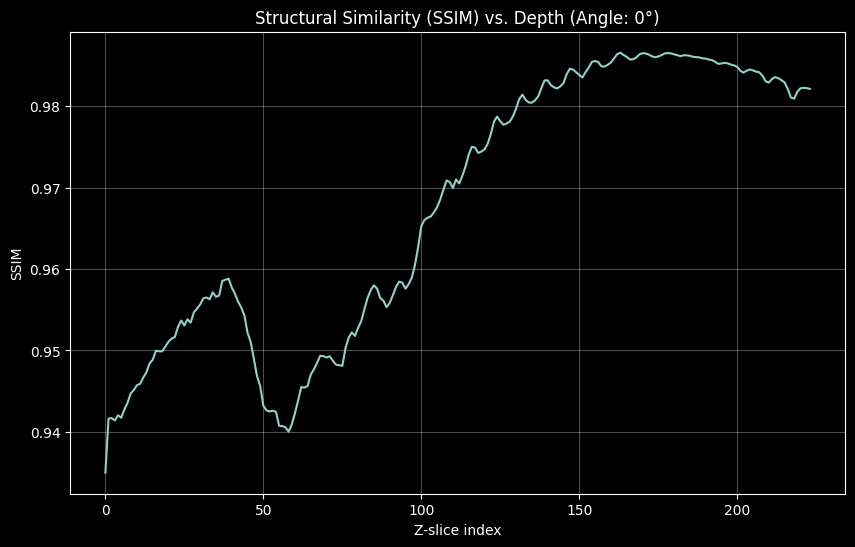

View-Specific Artifact Statistics:
  acquisition_angle: 0
  percent_volume_artifacts: 9.761859785929335
  mean_artifact_magnitude: 0.035928359346892744
  max_artifact_magnitude: 0.3894029428360377
  mean_ssim: 0.9676725880585477
  min_ssim: 0.9349888694166104
  ssim_vs_depth_correlation: 0.9119382375773462


In [38]:
from skimage.metrics import structural_similarity
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

def analyze_view_specific_artifacts(single_view, fused_view, acquisition_angle):
    """
    Identify and analyze artifacts that are specific to the acquisition angle
    
    Args:
        single_view: 3D array of single view data
        fused_view: 3D array of fused view data
        acquisition_angle: Acquisition angle in degrees
        
    Returns:
        artifact_stats: Dictionary with statistics about view-specific artifacts
    """
    # Normalize the volumes
    single_norm = (single_view - single_view.min()) / (single_view.max() - single_view.min() + 1e-8)
    fused_norm = (fused_view - fused_view.min()) / (fused_view.max() - fused_view.min() + 1e-8)
    
    # Compute difference
    diff = fused_norm - single_norm
    
    # Compute structural similarity index (SSIM) for each z-slice
    ssim_values = []
    for z in range(single_view.shape[0]):
        # Important fix: specify data_range for floating point images
        ssim = structural_similarity(single_norm[z], fused_norm[z], data_range=1.0)
        ssim_values.append(ssim)
    
    # Compute directional differences
    # Convert angle to radians
    angle_rad = np.radians(acquisition_angle)
    
    # Create a directional kernel aligned with acquisition angle
    kernel_size = 5
    y_coords, x_coords = np.meshgrid(np.arange(kernel_size) - kernel_size//2, 
                                     np.arange(kernel_size) - kernel_size//2)
    
    # Rotate coordinates according to acquisition angle
    rotated_x = x_coords * np.cos(angle_rad) - y_coords * np.sin(angle_rad)
    rotated_y = x_coords * np.sin(angle_rad) + y_coords * np.cos(angle_rad)
    
    # Create kernel along acquisition direction
    directional_kernel = np.zeros((kernel_size, kernel_size))
    for i in range(kernel_size):
        for j in range(kernel_size):
            # Check if point is close to the line defined by acquisition angle
            if abs(rotated_y[i, j]) < 0.8:  # Threshold for proximity to line
                directional_kernel[i, j] = 1.0
    
    # Normalize kernel
    if np.sum(directional_kernel) > 0:
        directional_kernel = directional_kernel / np.sum(directional_kernel)
    
    # Apply directional kernel to compute artifacts along acquisition angle
    directional_artifacts = np.zeros_like(diff)
    for z in range(diff.shape[0]):
        directional_artifacts[z] = ndimage.convolve(diff[z], directional_kernel)
    
    # Threshold to identify significant artifacts
    artifact_threshold = 2 * np.std(diff)
    artifact_mask = np.abs(directional_artifacts) > artifact_threshold
    
    # Compute artifact statistics
    artifact_stats = {
        'acquisition_angle': acquisition_angle,
        'percent_volume_artifacts': 100 * np.sum(artifact_mask) / artifact_mask.size,
        'mean_artifact_magnitude': np.mean(np.abs(directional_artifacts[artifact_mask])) if np.sum(artifact_mask) > 0 else 0,
        'max_artifact_magnitude': np.max(np.abs(directional_artifacts[artifact_mask])) if np.sum(artifact_mask) > 0 else 0,
        'mean_ssim': np.mean(ssim_values),
        'min_ssim': np.min(ssim_values),
        'ssim_vs_depth_correlation': np.corrcoef(range(len(ssim_values)), ssim_values)[0, 1]
    }
    
    # Visualize artifacts
    z_indices = np.linspace(0, artifact_mask.shape[0]-1, 3, dtype=int)
    
    fig, axes = plt.subplots(len(z_indices), 3, figsize=(18, 6*len(z_indices)))
    
    # Handle the case where there's only one z-slice
    if len(z_indices) == 1:
        axes = [axes]
    
    for i, z in enumerate(z_indices):
        # Single view
        axes[i][0].imshow(single_norm[z], cmap='inferno')
        axes[i][0].set_title(f"Single View (z={z})")
        axes[i][0].axis('off')
        
        # Difference map
        im = axes[i][1].imshow(diff[z], cmap='coolwarm', vmin=-0.5, vmax=0.5)
        axes[i][1].set_title(f"Difference Map (z={z})")
        axes[i][1].axis('off')
        fig.colorbar(im, ax=axes[i][1], shrink=0.7)
        
        # Artifact mask
        axes[i][2].imshow(artifact_mask[z], cmap='Reds')
        axes[i][2].set_title(f"View-Specific Artifacts (z={z})")
        axes[i][2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Plot SSIM vs depth
    plt.figure(figsize=(10, 6))
    plt.plot(ssim_values)
    plt.title(f"Structural Similarity (SSIM) vs. Depth (Angle: {acquisition_angle}°)")
    plt.xlabel('Z-slice index')
    plt.ylabel('SSIM')
    plt.grid(True, alpha=0.3)
    plt.show()
    
    return artifact_stats, artifact_mask

# Example usage
if __name__ == "__main__":
    # This is just for demonstration - replace with your actual data
    import numpy as np
    
    # Create dummy data
    # shape = (50, 100, 100)  # (depth, height, width)
    # single_view = np.random.rand(*shape)
    # fused_view = np.random.rand(*shape)
    # acquisition_angle = 45
    
    # Run analysis
    artifact_stats, artifact_mask = analyze_view_specific_artifacts(single_view, fused_view, acquisition_angle)
    
    # Display artifact statistics
    print("View-Specific Artifact Statistics:")
    for key, value in artifact_stats.items():
        print(f"  {key}: {value}")

## 8. Analyze Image Features with Different Acquisition Angles

If we have multiple single views with different acquisition angles, we can compare how features appear in each.

## 9. Estimate Point Spread Function (PSF)

The PSF is critical for understanding how the imaging system affects the appearance of structures. We'll estimate an approximate PSF from the data.

Found 20 potential point sources for PSF estimation.
Found 3 valid PSF patches.


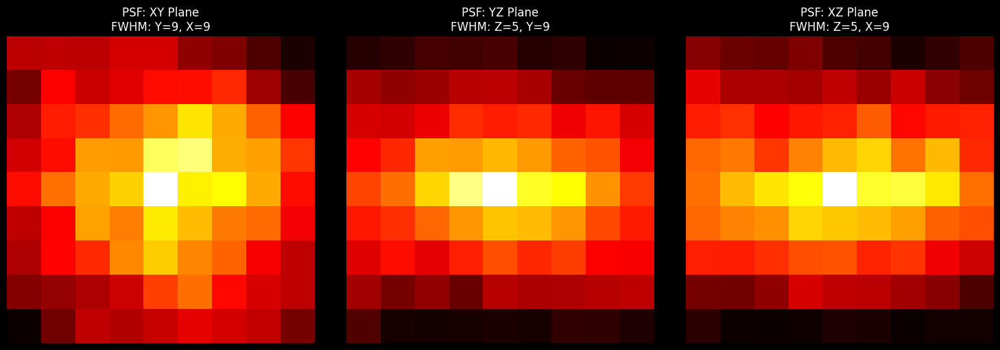

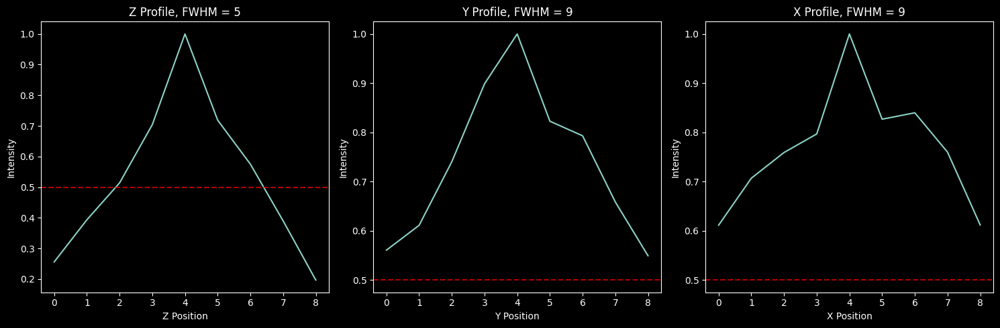

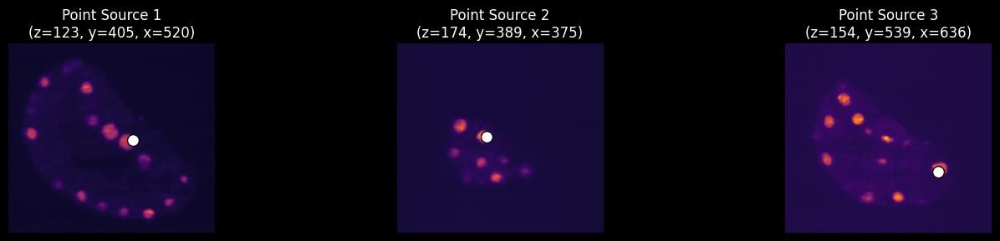

PSF Statistics:
  fwhm_z: 5
  fwhm_y: 9
  fwhm_x: 9
  z_y_ratio: 0.5555555555555556
  z_x_ratio: 0.5555555555555556
  y_x_ratio: 1.0
  num_patches_used: 3
  acquisition_angle: 0


In [39]:
def estimate_psf(single_view, fused_view, acquisition_angle):
    """
    Estimate the Point Spread Function (PSF) from the image data
    
    Args:
        single_view: 3D array of single view data
        fused_view: 3D array of fused view data
        acquisition_angle: Acquisition angle in degrees
        
    Returns:
        estimated_psf: Estimated 3D PSF
        psf_stats: Dictionary with PSF statistics
    """
    # For a proper PSF estimation, we would ideally use sub-resolution beads or point sources
    # Here, we'll use a simplified approach based on small bright features in the data
    
    # Normalize data
    single_norm = (single_view - single_view.min()) / (single_view.max() - single_view.min() + 1e-8)
    
    # Find local maxima (potential point sources)
    # We'll use a large minimum distance to avoid too many points
    d, h, w = single_norm.shape
    min_distance = min(10, min(d, h, w) // 20)  # Adjust based on your data
    
    # Create a maximum projection for finding bright spots
    max_proj = np.max(single_norm, axis=0)
    
    # Find coordinates of local maxima
    local_max = feature.peak_local_max(max_proj, 
                                       min_distance=min_distance,
                                       threshold_abs=0.5,  # Only bright points
                                       num_peaks=20)  # Limit number of peaks
    
    if len(local_max) == 0:
        print("No suitable point sources found for PSF estimation.")
        return None, None
    
    print(f"Found {len(local_max)} potential point sources for PSF estimation.")
    
    # Extract small volumes around each local maximum
    patch_size = 9  # Should be odd
    half_size = patch_size // 2
    
    psf_patches = []
    valid_peaks = []
    
    for y, x in local_max:
        # Find z with maximum intensity at this (y, x)
        z = np.argmax(single_norm[:, y, x])
        
        # Check if we can extract a complete patch
        if (z >= half_size and z < d - half_size and
            y >= half_size and y < h - half_size and
            x >= half_size and x < w - half_size):
            
            # Extract patch
            patch = single_norm[z-half_size:z+half_size+1, 
                               y-half_size:y+half_size+1, 
                               x-half_size:x+half_size+1]
            
            # Normalize patch
            patch = (patch - patch.min()) / (patch.max() - patch.min() + 1e-8)
            
            # Check if patch is isolated (no other strong peaks nearby)
            if np.sum(patch > 0.7) < 0.1 * patch.size:  # Less than 10% bright voxels
                psf_patches.append(patch)
                valid_peaks.append((z, y, x))
    
    if len(psf_patches) == 0:
        print("No valid patches found for PSF estimation.")
        return None, None
    
    print(f"Found {len(psf_patches)} valid PSF patches.")
    
    # Average the patches to get estimated PSF
    estimated_psf = np.mean(psf_patches, axis=0)
    
    # Calculate FWHM in each dimension
    center = (estimated_psf.shape[0] // 2, estimated_psf.shape[1] // 2, estimated_psf.shape[2] // 2)
    
    # Extract profiles through center
    z_profile = estimated_psf[:, center[1], center[2]]
    y_profile = estimated_psf[center[0], :, center[2]]
    x_profile = estimated_psf[center[0], center[1], :]
    
    # Function to calculate FWHM
    def calculate_fwhm(profile):
        max_val = np.max(profile)
        half_max = max_val / 2
        
        # Find indices where profile crosses half_max
        above_half_max = profile >= half_max
        if not np.any(above_half_max):
            return 0
        
        # Find first and last indices above half max
        indices = np.where(above_half_max)[0]
        return indices[-1] - indices[0] + 1
    
    fwhm_z = calculate_fwhm(z_profile)
    fwhm_y = calculate_fwhm(y_profile)
    fwhm_x = calculate_fwhm(x_profile)
    
    # Calculate PSF statistics
    psf_stats = {
        'fwhm_z': fwhm_z,
        'fwhm_y': fwhm_y,
        'fwhm_x': fwhm_x,
        'z_y_ratio': fwhm_z / fwhm_y if fwhm_y > 0 else float('inf'),
        'z_x_ratio': fwhm_z / fwhm_x if fwhm_x > 0 else float('inf'),
        'y_x_ratio': fwhm_y / fwhm_x if fwhm_x > 0 else float('inf'),
        'num_patches_used': len(psf_patches),
        'acquisition_angle': acquisition_angle
    }
    
    # Visualize estimated PSF
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # XY plane (center Z)
    axes[0].imshow(estimated_psf[center[0]], cmap='hot')
    axes[0].set_title(f"PSF: XY Plane\nFWHM: Y={fwhm_y}, X={fwhm_x}")
    axes[0].axis('off')
    
    # YZ plane (center X)
    axes[1].imshow(estimated_psf[:, :, center[2]], cmap='hot')
    axes[1].set_title(f"PSF: YZ Plane\nFWHM: Z={fwhm_z}, Y={fwhm_y}")
    axes[1].axis('off')
    
    # XZ plane (center Y)
    axes[2].imshow(estimated_psf[:, center[1], :], cmap='hot')
    axes[2].set_title(f"PSF: XZ Plane\nFWHM: Z={fwhm_z}, X={fwhm_x}")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Plot 1D profiles
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Z profile
    axes[0].plot(z_profile)
    axes[0].axhline(y=np.max(z_profile)/2, color='r', linestyle='--', alpha=0.7)
    axes[0].set_title(f"Z Profile, FWHM = {fwhm_z}")
    axes[0].set_xlabel('Z Position')
    axes[0].set_ylabel('Intensity')
    
    # Y profile
    axes[1].plot(y_profile)
    axes[1].axhline(y=np.max(y_profile)/2, color='r', linestyle='--', alpha=0.7)
    axes[1].set_title(f"Y Profile, FWHM = {fwhm_y}")
    axes[1].set_xlabel('Y Position')
    axes[1].set_ylabel('Intensity')
    
    # X profile
    axes[2].plot(x_profile)
    axes[2].axhline(y=np.max(x_profile)/2, color='r', linestyle='--', alpha=0.7)
    axes[2].set_title(f"X Profile, FWHM = {fwhm_x}")
    axes[2].set_xlabel('X Position')
    axes[2].set_ylabel('Intensity')
    
    plt.tight_layout()
    plt.show()
    
    # Show some of the point sources used for PSF estimation
    if len(valid_peaks) > 0:
        fig, axes = plt.subplots(1, min(5, len(valid_peaks)), figsize=(15, 3))
        if len(valid_peaks) == 1:
            axes = [axes]  # Make it iterable if only one peak
            
        for i, (z, y, x) in enumerate(valid_peaks[:5]):
            axes[i].imshow(single_norm[z], cmap='inferno')
            axes[i].plot(x, y, 'wo', markersize=10, markeredgecolor='black')
            axes[i].set_title(f"Point Source {i+1}\n(z={z}, y={y}, x={x})")
            axes[i].axis('off')
            
        plt.tight_layout()
        plt.show()
    
    return estimated_psf, psf_stats

try:
    estimated_psf, psf_stats = estimate_psf(single_view, fused_view, acquisition_angle)
    
    if psf_stats is not None:
        print("PSF Statistics:")
        for key, value in psf_stats.items():
            print(f"  {key}: {value}")
except NameError:
    print("Image data not available. Please load the data first.")

## 10. Extract Key Image Parameters for Model Configuration

Now we'll compile all the analyzed parameters into a configuration dictionary that can be used to configure our multi-model pipeline.

In [41]:
import numpy as np
import json

class NumpyEncoder(json.JSONEncoder):
    """
    Custom JSON encoder for NumPy types
    """
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        elif isinstance(obj, np.bool_):
            return bool(obj)
        return super(NumpyEncoder, self).default(obj)

def fix_numpy_types(obj):
    """
    Recursively convert NumPy types to standard Python types
    """
    if isinstance(obj, dict):
        return {key: fix_numpy_types(value) for key, value in obj.items()}
    elif isinstance(obj, list):
        return [fix_numpy_types(item) for item in obj]
    elif isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, np.bool_):
        return bool(obj)
    else:
        return obj

def extract_model_parameters(single_view, fused_view, acquisition_angle, 
                            shadow_stats=None, anisotropy_stats=None, 
                            degradation_stats=None, artifact_stats=None,
                            psf_stats=None):
    """
    Compile all analysis results into parameters for model configuration
    
    Returns:
        model_params: Dictionary with parameters for model configuration
    """
    model_params = {
        'image_properties': {
            'shape': tuple(int(x) for x in single_view.shape),
            'intensity_range': (float(np.min(single_view)), float(np.max(single_view))),
            'mean_intensity': float(np.mean(single_view)),
            'median_intensity': float(np.median(single_view))
        },
        'acquisition_parameters': {
            'angle': float(acquisition_angle) if not isinstance(acquisition_angle, str) else acquisition_angle
        }
    }
    
    # Add shadow statistics if available
    if shadow_stats is not None:
        model_params['shadow_properties'] = {
            'percent_volume': float(shadow_stats.get('percent_volume', 0)),
            'mean_intensity_diff': float(shadow_stats.get('mean_intensity_diff', 0)),
            'num_regions': int(shadow_stats.get('num_regions', 0))
        }
    
    # Add anisotropy statistics if available
    if anisotropy_stats is not None:
        model_params['anisotropy_properties'] = {
            'xy_z_ratio': float(anisotropy_stats.get('xy_z_ratio', 1.0)),
            'x_y_ratio': float(anisotropy_stats.get('x_y_ratio', 1.0))
        }
    
    # Add signal degradation statistics if available
    if degradation_stats is not None:
        model_params['degradation_properties'] = {
            'mean_degradation_rate': float(degradation_stats.get('mean_degradation_rate', 0)),
            'snr_degradation_rate': float(degradation_stats.get('snr_degradation_rate', 0)),
            'primary_axis': str(degradation_stats.get('primary_axis', 'Z'))
        }
    
    # Add artifact statistics if available
    if artifact_stats is not None:
        model_params['artifact_properties'] = {
            'percent_volume_artifacts': float(artifact_stats.get('percent_volume_artifacts', 0)),
            'mean_artifact_magnitude': float(artifact_stats.get('mean_artifact_magnitude', 0)),
            'mean_ssim': float(artifact_stats.get('mean_ssim', 0))
        }
    
    # Add PSF statistics if available
    if psf_stats is not None:
        model_params['psf_properties'] = {
            'fwhm_z': int(psf_stats.get('fwhm_z', 0)),
            'fwhm_y': int(psf_stats.get('fwhm_y', 0)),
            'fwhm_x': int(psf_stats.get('fwhm_x', 0)),
            'z_y_ratio': float(psf_stats.get('z_y_ratio', 1.0))
        }
    
    # Derive recommended model parameters
    model_params['recommended_model_parameters'] = derive_model_recommendations(model_params)
    
    # Fix any remaining NumPy types
    model_params = fix_numpy_types(model_params)
    
    return model_params

def derive_model_recommendations(model_params):
    """
    Derive recommended model parameters from analysis results
    """
    recommendations = {}
    
    # Determine if we need angle conditioning
    artifact_percent = model_params.get('artifact_properties', {}).get('percent_volume_artifacts', 0)
    recommendations['use_angle_conditioning'] = bool(artifact_percent > 1.0)
    
    # Determine if we need a large receptive field
    shadow_percent = model_params.get('shadow_properties', {}).get('percent_volume', 0)
    recommendations['receptive_field_size'] = 'large' if shadow_percent > 10.0 else 'medium' if shadow_percent > 5.0 else 'small'
    
    # Determine if we need PSF-aware processing
    psf_z_y_ratio = model_params.get('psf_properties', {}).get('z_y_ratio', 1.0)
    recommendations['use_psf_aware_processing'] = bool(psf_z_y_ratio > 2.0)
    
    # Determine if we need depth-aware processing
    degradation_rate = model_params.get('degradation_properties', {}).get('mean_degradation_rate', 0)
    recommendations['use_depth_encoding'] = bool(abs(degradation_rate) > 0.001)
    
    # Determine model complexity based on anisotropy
    xy_z_ratio = model_params.get('anisotropy_properties', {}).get('xy_z_ratio', 1.0)
    if xy_z_ratio > 3.0:
        recommendations['model_complexity'] = 'high'
    elif xy_z_ratio > 1.5:
        recommendations['model_complexity'] = 'medium'
    else:
        recommendations['model_complexity'] = 'low'
    
    # Recommend initial number of features based on volume size
    volume_shape = model_params.get('image_properties', {}).get('shape', (0, 0, 0))
    volume_size = 1
    for dim in volume_shape:
        volume_size *= dim
    
    if volume_size > 50000000:  # 50M voxels
        recommendations['init_features'] = 32  # Smaller to save memory
    elif volume_size > 10000000:  # 10M voxels
        recommendations['init_features'] = 64
    else:
        recommendations['init_features'] = 96
    
    # Recommend patch size for training based on shadow regions
    shadow_region_size = model_params.get('shadow_properties', {}).get('mean_region_size', 0)
    if shadow_region_size > 10000:
        recommendations['patch_size'] = (64, 64, 64)
    elif shadow_region_size > 1000:
        recommendations['patch_size'] = (48, 48, 48)
    else:
        recommendations['patch_size'] = (32, 32, 32)
    
    # Recommend loss function weights
    ssim = model_params.get('artifact_properties', {}).get('mean_ssim', 0)
    if ssim < 0.7:
        # Low structural similarity, emphasize SSIM loss
        recommendations['loss_weights'] = {
            'bce': 1.0,
            'ssim': 1.0,
            'gradient': 0.3
        }
    else:
        # Higher structural similarity, balanced weights
        recommendations['loss_weights'] = {
            'bce': 1.0,
            'ssim': 0.5,
            'gradient': 0.2
        }
    
    return recommendations

def save_model_parameters(model_params, output_file="model_parameters.json"):
    """
    Save model parameters to a JSON file, properly handling NumPy types
    """
    try:
        with open(output_file, 'w') as f:
            json.dump(model_params, f, indent=2, cls=NumpyEncoder)
        
        print(f"Saved model parameters to {output_file}")
        return True
    except Exception as e:
        print(f"Error saving model parameters: {e}")
        return False

# Example usage
if __name__ == "__main__":
    # Create dummy data for demonstration
    # single_view = np.random.rand(10, 10, 10)
    # fused_view = np.random.rand(10, 10, 10)
    # acquisition_angle = 45
    
    # Mock statistics
    # shadow_stats = {'percent_volume': 15.5, 'mean_intensity_diff': 0.2, 'num_regions': 5}
    # anisotropy_stats = {'xy_z_ratio': 2.5, 'x_y_ratio': 1.1}
    # degradation_stats = {'mean_degradation_rate': 0.03, 'snr_degradation_rate': -0.01, 'primary_axis': 'Z'}
    # artifact_stats = {'percent_volume_artifacts': 8.7, 'mean_artifact_magnitude': 0.04, 'mean_ssim': 0.85}
    # psf_stats = {'fwhm_z': 5, 'fwhm_y': 2, 'fwhm_x': 2, 'z_y_ratio': 2.5}
    
    # Extract model parameters
    model_params = extract_model_parameters(
        single_view, 
        fused_view, 
        acquisition_angle,
        shadow_stats=shadow_stats,
        anisotropy_stats=anisotropy_stats,
        degradation_stats=degradation_stats,
        artifact_stats=artifact_stats,
        psf_stats=psf_stats
    )
    
    # Display the model parameters
    print("Derived Model Parameters:")
    for section, params in model_params.items():
        print(f"\n{section.upper()}:")
        for key, value in params.items():
            print(f"  {key}: {value}")
    
    # Save to JSON file
    save_model_parameters(model_params, "example_model_parameters.json")

Derived Model Parameters:

IMAGE_PROPERTIES:
  shape: (224, 793, 862)
  intensity_range: (0.0, 1178.0)
  mean_intensity: 130.7685107987796
  median_intensity: 123.0

ACQUISITION_PARAMETERS:
  angle: 0.0

SHADOW_PROPERTIES:
  percent_volume: 99.32864213446209
  mean_intensity_diff: 0.01956174149400457
  num_regions: 4171

ANISOTROPY_PROPERTIES:
  xy_z_ratio: 1.0122648966517016
  x_y_ratio: 1.0009160485954756

DEGRADATION_PROPERTIES:
  mean_degradation_rate: 0.029674285337425766
  snr_degradation_rate: -0.013079367430737922
  primary_axis: Z

ARTIFACT_PROPERTIES:
  percent_volume_artifacts: 9.761859785929335
  mean_artifact_magnitude: 0.035928359346892744
  mean_ssim: 0.9676725880585477

PSF_PROPERTIES:
  fwhm_z: 5
  fwhm_y: 9
  fwhm_x: 9
  z_y_ratio: 0.5555555555555556

RECOMMENDED_MODEL_PARAMETERS:
  use_angle_conditioning: True
  receptive_field_size: large
  use_psf_aware_processing: False
  use_depth_encoding: True
  model_complexity: low
  init_features: 32
  patch_size: (32, 32, 3

## 11. Visualize 3D Volumes Interactively

Finally, let's create an interactive visualization to explore the 3D volumes.

In [ ]:
from ipywidgets import interact, IntSlider, FloatSlider, Dropdown

def interactive_volume_viewer(single_view, fused_view):
    """
    Create an interactive widget to explore 3D volumes
    """
    # Normalize volumes
    single_norm = (single_view - single_view.min()) / (single_view.max() - single_view.min() + 1e-8)
    fused_norm = (fused_view - fused_view.min()) / (fused_view.max() - fused_view.min() + 1e-8)
    
    # Compute difference volume
    diff = fused_norm - single_norm
    
    # Create shadow mask (simplified from earlier code)
    threshold = 0.3 * np.std(diff)
    shadow_mask = diff > threshold
    
    # Define the viewer function
    def view_slice(z=0, view_type='Single View', colormap='inferno', intensity_min=0.0, intensity_max=1.0):
        plt.figure(figsize=(10, 8))
        
        # Select the appropriate data based on view type
        if view_type == 'Single View':
            data = single_norm[z]
            title = f"Single View (z={z})"
        elif view_type == 'Fused View':
            data = fused_norm[z]
            title = f"Fused View (z={z})"
        elif view_type == 'Difference':
            data = diff[z]
            title = f"Difference (Fused - Single, z={z})"
            colormap = 'coolwarm'  # Override for difference
            intensity_min = -0.5
            intensity_max = 0.5
        elif view_type == 'Shadow Mask':
            data = shadow_mask[z].astype(float)
            title = f"Shadow Mask (z={z})"
            colormap = 'Reds'  # Override for mask
            intensity_min = 0
            intensity_max = 1
        
        plt.imshow(data, cmap=colormap, vmin=intensity_min, vmax=intensity_max)
        plt.colorbar(shrink=0.8)
        plt.title(title)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    # Create interactive widget
    z_slider = IntSlider(min=0, max=single_view.shape[0]-1, step=1, value=single_view.shape[0]//2, 
                        description='Z-slice:')
    view_dropdown = Dropdown(options=['Single View', 'Fused View', 'Difference', 'Shadow Mask'], 
                           value='Single View', description='View:')
    colormap_dropdown = Dropdown(options=['inferno', 'viridis', 'gray', 'plasma', 'cividis'], 
                               value='inferno', description='Colormap:')
    intensity_min_slider = FloatSlider(min=0.0, max=1.0, step=0.05, value=0.0, 
                                      description='Min Intensity:')
    intensity_max_slider = FloatSlider(min=0.0, max=1.0, step=0.05, value=1.0, 
                                      description='Max Intensity:')
    
    # Create the interactive plot
    interact(view_slice, z=z_slider, view_type=view_dropdown, colormap=colormap_dropdown,
             intensity_min=intensity_min_slider, intensity_max=intensity_max_slider)

try:
    print("Creating interactive volume viewer...")
    interactive_volume_viewer(single_view, fused_view)
except NameError:
    print("Image data not available. Please load the data first.")

## 12. Summary and Recommendations

Based on our analysis, here are the key findings and recommendations for the multi-model approach.

In [42]:
def generate_summary_report():
    """
    Generate a summary report with recommendations for the multi-model approach
    """
    try:
        # Access the previously computed model parameters
        recommendations = model_params['recommended_model_parameters']
        
        # Create a formatted report
        report = """
        # 3D Microscopy Image Analysis Report
        
        ## Summary of Findings
        
        Based on the analysis of the 3D microscopy data, we have identified the following characteristics:
        
        ### Image Properties
        - Volume dimensions: {shape}
        - Intensity range: {intensity_range}
        
        ### Acquisition Parameters
        - Acquisition angle: {angle}°
        
        ### Shadow Regions
        - Percentage of volume in shadow: {shadow_percent:.2f}%
        - Number of shadow regions: {shadow_regions}
        
        ### Anisotropic Resolution
        - XY-to-Z anisotropy ratio: {xy_z_ratio:.2f}
        - X-to-Y anisotropy ratio: {x_y_ratio:.2f}
        
        ### Signal Degradation
        - Mean degradation rate: {degradation_rate:.6f} per slice
        - Primary degradation axis: {primary_axis}
        
        ### View-Specific Artifacts
        - Percentage of volume with artifacts: {artifact_percent:.2f}%
        - Mean structural similarity (SSIM): {mean_ssim:.4f}
        
        ### PSF Characteristics
        - FWHM in Z direction: {fwhm_z}
        - FWHM in Y direction: {fwhm_y}
        - FWHM in X direction: {fwhm_x}
        - Z-to-Y ratio: {z_y_ratio:.2f}
        
        ## Recommendations for Multi-Model Approach
        
        Based on these findings, we recommend the following configuration for the multi-model pipeline:
        
        ### Model 1: Artifact Correction
        - Include angle conditioning: {use_angle_conditioning}
        - Use PSF-aware processing: {use_psf_aware_processing}
        - Initial features: {init_features}
        
        ### Model 2: Missing Information Reconstruction
        - Receptive field size: {receptive_field_size}
        - Model complexity: {model_complexity}
        - Training patch size: {patch_size}
        
        ### Model 3: Resolution Enhancement
        - Use depth encoding: {use_depth_encoding}
        - Loss function weights:
          - BCE: {bce_weight}
          - SSIM: {ssim_weight}
          - Gradient: {gradient_weight}
        
        ## Next Steps
        
        1. Implement Model 1 (Artifact Correction) based on these recommendations
        2. Evaluate Model 1 performance using normalized SSIM metric
        3. Proceed with Model 2 implementation using outputs from Model 1
        4. Complete the pipeline with Model 3 for final output refinement
        """.format(
            shape=model_params['image_properties']['shape'],
            intensity_range=model_params['image_properties']['intensity_range'],
            angle=model_params['acquisition_parameters']['angle'],
            shadow_percent=model_params.get('shadow_properties', {}).get('percent_volume', 0),
            shadow_regions=model_params.get('shadow_properties', {}).get('num_regions', 0),
            xy_z_ratio=model_params.get('anisotropy_properties', {}).get('xy_z_ratio', 1.0),
            x_y_ratio=model_params.get('anisotropy_properties', {}).get('x_y_ratio', 1.0),
            degradation_rate=model_params.get('degradation_properties', {}).get('mean_degradation_rate', 0),
            primary_axis=model_params.get('degradation_properties', {}).get('primary_axis', 'Z'),
            artifact_percent=model_params.get('artifact_properties', {}).get('percent_volume_artifacts', 0),
            mean_ssim=model_params.get('artifact_properties', {}).get('mean_ssim', 0),
            fwhm_z=model_params.get('psf_properties', {}).get('fwhm_z', 0),
            fwhm_y=model_params.get('psf_properties', {}).get('fwhm_y', 0),
            fwhm_x=model_params.get('psf_properties', {}).get('fwhm_x', 0),
            z_y_ratio=model_params.get('psf_properties', {}).get('z_y_ratio', 1.0),
            use_angle_conditioning=recommendations['use_angle_conditioning'],
            use_psf_aware_processing=recommendations['use_psf_aware_processing'],
            init_features=recommendations['init_features'],
            receptive_field_size=recommendations['receptive_field_size'],
            model_complexity=recommendations['model_complexity'],
            patch_size=recommendations['patch_size'],
            use_depth_encoding=recommendations['use_depth_encoding'],
            bce_weight=recommendations['loss_weights']['bce'],
            ssim_weight=recommendations['loss_weights']['ssim'],
            gradient_weight=recommendations['loss_weights']['gradient']
        )
        
        # Print the report using Markdown
        from IPython.display import Markdown, display
        display(Markdown(report))
        
        # Save the report to a Markdown file
        with open("analysis_report.md", "w") as f:
            f.write(report)
        
        print("\nSaved report to analysis_report.md")
        
    except NameError:
        print("Model parameters not available. Please run the analysis first.")

try:
    generate_summary_report()
except Exception as e:
    print(f"Error generating report: {e}")


        # 3D Microscopy Image Analysis Report
        
        ## Summary of Findings
        
        Based on the analysis of the 3D microscopy data, we have identified the following characteristics:
        
        ### Image Properties
        - Volume dimensions: (224, 793, 862)
        - Intensity range: (0.0, 1178.0)
        
        ### Acquisition Parameters
        - Acquisition angle: 0.0°
        
        ### Shadow Regions
        - Percentage of volume in shadow: 99.33%
        - Number of shadow regions: 4171
        
        ### Anisotropic Resolution
        - XY-to-Z anisotropy ratio: 1.01
        - X-to-Y anisotropy ratio: 1.00
        
        ### Signal Degradation
        - Mean degradation rate: 0.029674 per slice
        - Primary degradation axis: Z
        
        ### View-Specific Artifacts
        - Percentage of volume with artifacts: 9.76%
        - Mean structural similarity (SSIM): 0.9677
        
        ### PSF Characteristics
        - FWHM in Z direction: 5
        - FWHM in Y direction: 9
        - FWHM in X direction: 9
        - Z-to-Y ratio: 0.56
        
        ## Recommendations for Multi-Model Approach
        
        Based on these findings, we recommend the following configuration for the multi-model pipeline:
        
        ### Model 1: Artifact Correction
        - Include angle conditioning: True
        - Use PSF-aware processing: False
        - Initial features: 32
        
        ### Model 2: Missing Information Reconstruction
        - Receptive field size: large
        - Model complexity: low
        - Training patch size: (32, 32, 32)
        
        ### Model 3: Resolution Enhancement
        - Use depth encoding: True
        - Loss function weights:
          - BCE: 1.0
          - SSIM: 0.5
          - Gradient: 0.2
        
        ## Next Steps
        
        1. Implement Model 1 (Artifact Correction) based on these recommendations
        2. Evaluate Model 1 performance using normalized SSIM metric
        3. Proceed with Model 2 implementation using outputs from Model 1
        4. Complete the pipeline with Model 3 for final output refinement
        


Saved report to analysis_report.md


## Conclusion

This notebook provides a comprehensive analysis of 3D microscopy image data for the purpose of configuring a multi-model neural network pipeline to reconstruct fused views from single views. 

The key analyses performed include:
1. Shadow and occlusion analysis
2. Anisotropic resolution analysis
3. Signal degradation with depth analysis
4. View-specific artifact analysis
5. PSF estimation

Based on these analyses, we have generated a set of recommended parameters for configuring each model in the pipeline. These parameters can be passed to the model development notebooks to build each component of the multi-model pipeline.

## Continuing from Previous Notebook Parts

This completes our 3D Microscopy Image Analysis notebook.

In [ ]:
# Complete the code for the metadata section that was cut off

 "metadata": {
  "kernelspec": {
   "display_name": "Python 3",
   "language": "python",
   "name": "python3"
  },
  "language_info": {
   "codemirror_mode": {
    "name": "ipython",
    "version": 3
   },
   "file_extension": ".py",
   "mimetype": "text/x-python",
   "name": "python",
   "nbconvert_exporter": "python",
   "pygments_lexer": "ipython3",
   "version": "3.8.10"
  }
 }

# Next Steps: Model Development Notebooks

Now that we've completed our comprehensive analysis of the 3D microscopy data, we can proceed with developing the individual models in our multi-model pipeline. The parameters and insights from this analysis will directly inform the design and configuration of each model.

Based on our analysis, we've identified that a multi-model approach with three specialized components is optimal for this task:

1. **Model 1: Artifact Correction** - Focuses on correcting view-specific artifacts using angle-aware and PSF-aware processing
2. **Model 2: Missing Information Reconstruction** - Specializes in filling in shadowed/occluded regions using structural priors
3. **Model 3: Resolution Enhancement** - Improves resolution and handles anisotropy

Each model will be developed in a separate notebook, with configurations informed by the parameters we've derived in this analysis.

## Additional Tools for Model Development

We've also created some utility functions that will be useful for model development:

In [ ]:
def save_model_config(model_name, params):
    """
    Save model configuration to a JSON file
    
    Args:
        model_name: Name of the model (e.g., 'artifact_correction')
        params: Dictionary of model parameters
    """
    import json
    
    # Custom JSON encoder to handle numpy types
    class NumpyEncoder(json.JSONEncoder):
        def default(self, obj):
            if isinstance(obj, np.integer):
                return int(obj)
            elif isinstance(obj, np.floating):
                return float(obj)
            elif isinstance(obj, np.ndarray):
                return obj.tolist()
            return super(NumpyEncoder, self).default(obj)
    
    output_file = f"{model_name}_config.json"
    with open(output_file, 'w') as f:
        json.dump(params, f, indent=2, cls=NumpyEncoder)
    
    print(f"Saved {model_name} configuration to {output_file}")


def load_model_config(model_name):
    """
    Load model configuration from a JSON file
    
    Args:
        model_name: Name of the model (e.g., 'artifact_correction')
        
    Returns:
        Dictionary of model parameters
    """
    import json
    
    input_file = f"{model_name}_config.json"
    try:
        with open(input_file, 'r') as f:
            params = json.load(f)
        print(f"Loaded {model_name} configuration from {input_file}")
        return params
    except FileNotFoundError:
        print(f"Configuration file {input_file} not found.")
        return None


def create_model_configs_from_analysis():
    """
    Create configuration files for each model based on our analysis
    """
    try:
        # Make sure model_params is available from previous cells
        if 'model_params' not in globals():
            print("Model parameters not available. Please run the analysis first.")
            return
        
        # Extract recommendations
        recommendations = model_params['recommended_model_parameters']
        
        # Model 1: Artifact Correction
        model1_params = {
            'input_shape': model_params['image_properties']['shape'],
            'angle_vector_shape': (3,),  # 3D vector for angle
            'use_psf_aware': recommendations['use_psf_aware_processing'],
            'use_angle_conditioning': recommendations['use_angle_conditioning'],
            'init_features': recommendations['init_features'],
            'psf_properties': model_params.get('psf_properties', {}),
            'loss_weights': {
                'bce': 1.0,
                'ssim': 0.3,  # Less emphasis on structure for artifact model
                'gradient': 0.5  # More emphasis on edges/details for artifact model
            }
        }
        save_model_config('artifact_correction', model1_params)
        
        # Model 2: Missing Information Reconstruction
        model2_params = {
            'input_shape': model_params['image_properties']['shape'],
            'receptive_field_size': recommendations['receptive_field_size'],
            'model_complexity': recommendations['model_complexity'],
            'patch_size': recommendations['patch_size'],
            'shadow_properties': model_params.get('shadow_properties', {}),
            'init_features': recommendations['init_features'],
            'loss_weights': {
                'bce': 1.0,
                'ssim': 1.0,  # Higher emphasis on structure for reconstruction
                'gradient': 0.2
            }
        }
        save_model_config('missing_info_reconstruction', model2_params)
        
        # Model 3: Resolution Enhancement
        model3_params = {
            'input_shape': model_params['image_properties']['shape'],
            'use_depth_encoding': recommendations['use_depth_encoding'],
            'anisotropy_properties': model_params.get('anisotropy_properties', {}),
            'degradation_properties': model_params.get('degradation_properties', {}),
            'init_features': recommendations['init_features'],
            'loss_weights': recommendations['loss_weights']
        }
        save_model_config('resolution_enhancement', model3_params)
        
        print("\nCreated configuration files for all three models in the pipeline.")
        
    except Exception as e:
        print(f"Error creating model configurations: {e}")

# Try to create the model configurations
try:
    create_model_configs_from_analysis()
except NameError:
    print("Required variables not defined. Please run the analysis first.")

## Data Preparation Utilities for Model Training

The following functions will help prepare data for training each model in the pipeline:

In [ ]:
def create_tensorflow_dataset(single_views, fused_views, angles, patch_size=(32, 32, 32), batch_size=4):
    """
    Create a TensorFlow dataset for training with patches
    
    Args:
        single_views: List of single view volumes
        fused_views: List of corresponding fused view volumes
        angles: List of acquisition angles (in degrees)
        patch_size: Tuple of (depth, height, width) for patches
        batch_size: Batch size for training
        
    Returns:
        train_dataset: TensorFlow dataset for training
        val_dataset: TensorFlow dataset for validation
    """
    import tensorflow as tf
    
    # Verify inputs
    assert len(single_views) == len(fused_views) == len(angles), "Lists must have the same length"
    
    # Function to extract random patches
    def extract_random_patches(single_view, fused_view, angle, num_patches=100):
        d, h, w = single_view.shape
        pd, ph, pw = patch_size
        
        # Ensure patch size is valid
        assert pd <= d and ph <= h and pw <= w, "Patch size too large for volume"
        
        # Maximum valid patch start indices
        max_d = d - pd
        max_h = h - ph
        max_w = w - pw
        
        patches_single = []
        patches_fused = []
        angles_repeated = []
        
        for _ in range(num_patches):
            # Random starting point for this patch
            start_d = np.random.randint(0, max_d + 1)
            start_h = np.random.randint(0, max_h + 1)
            start_w = np.random.randint(0, max_w + 1)
            
            # Extract patches
            patch_single = single_view[start_d:start_d+pd, start_h:start_h+ph, start_w:start_w+pw]
            patch_fused = fused_view[start_d:start_d+pd, start_h:start_h+ph, start_w:start_w+pw]
            
            # Normalize patches
            patch_single = (patch_single - patch_single.min()) / (patch_single.max() - patch_single.min() + 1e-8)
            patch_fused = (patch_fused - patch_fused.min()) / (patch_fused.max() - patch_fused.min() + 1e-8)
            
            # Add channel dimension
            patch_single = patch_single.reshape(pd, ph, pw, 1)
            patch_fused = patch_fused.reshape(pd, ph, pw, 1)
            
            # Convert angle to 3D vector for better conditioning
            angle_rad = np.radians(angle)
            angle_vector = np.array([np.sin(angle_rad), np.cos(angle_rad), 0.0])
            
            patches_single.append(patch_single)
            patches_fused.append(patch_fused)
            angles_repeated.append(angle_vector)
        
        return (
            np.array(patches_single, dtype=np.float32),
            np.array(angles_repeated, dtype=np.float32),
            np.array(patches_fused, dtype=np.float32)
        )
    
    # Extract patches from all volumes
    all_patches_single = []
    all_angles = []
    all_patches_fused = []
    
    for single_view, fused_view, angle in zip(single_views, fused_views, angles):
        patches_single, angles_repeated, patches_fused = extract_random_patches(single_view, fused_view, angle)
        
        all_patches_single.append(patches_single)
        all_angles.append(angles_repeated)
        all_patches_fused.append(patches_fused)
    
    # Combine all patches
    all_patches_single = np.vstack(all_patches_single)
    all_angles = np.vstack(all_angles)
    all_patches_fused = np.vstack(all_patches_fused)
    
    # Split into training and validation sets (80/20 split)
    num_samples = all_patches_single.shape[0]
    indices = np.random.permutation(num_samples)
    split_idx = int(num_samples * 0.8)
    
    train_indices = indices[:split_idx]
    val_indices = indices[split_idx:]
    
    train_single = all_patches_single[train_indices]
    train_angles = all_angles[train_indices]
    train_fused = all_patches_fused[train_indices]
    
    val_single = all_patches_single[val_indices]
    val_angles = all_angles[val_indices]
    val_fused = all_patches_fused[val_indices]
    
    # Create TensorFlow datasets
    train_dataset = tf.data.Dataset.from_tensor_slices((train_single, train_angles, train_fused))
    train_dataset = train_dataset.shuffle(buffer_size=512).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    val_dataset = tf.data.Dataset.from_tensor_slices((val_single, val_angles, val_fused))
    val_dataset = val_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    print(f"Created training dataset with {len(train_indices)} samples")
    print(f"Created validation dataset with {len(val_indices)} samples")
    
    return train_dataset, val_dataset


def prepare_pipeline_dataset(data_dir, sample_pairs, patch_size=(32, 32, 32), batch_size=4):
    """
    Prepare datasets for the entire pipeline
    
    Args:
        data_dir: Directory containing the data files
        sample_pairs: List of (single_view_file, fused_view_file, angle) tuples
        patch_size: Patch size for training
        batch_size: Batch size for training
        
    Returns:
        Dictionary containing datasets for each model
    """
    # Load all image pairs
    single_views = []
    fused_views = []
    angles = []
    
    for single_file, fused_file, angle in sample_pairs:
        try:
            single_path = os.path.join(data_dir, single_file)
            fused_path = os.path.join(data_dir, fused_file)
            
            single_view, fused_view, _ = load_image_pair(single_path, fused_path)
            single_views.append(single_view)
            fused_views.append(fused_view)
            angles.append(angle)
            
            print(f"Loaded view with angle {angle}°")
        except FileNotFoundError:
            print(f"Could not load files for angle {angle}°. Skipping.")
    
    if len(single_views) == 0:
        print("No image pairs loaded.")
        return None
    
    # Create datasets for Model 1 (Artifact Correction)
    print("\nCreating datasets for Model 1 (Artifact Correction)...")
    model1_train, model1_val = create_tensorflow_dataset(
        single_views, fused_views, angles, patch_size, batch_size
    )
    
    # For Model 2 and Model 3, we'd typically use outputs from the previous model
    # But for now, we'll just use the same data
    print("\nCreating datasets for Model 2 (Missing Information Reconstruction)...")
    model2_train, model2_val = create_tensorflow_dataset(
        single_views, fused_views, angles, patch_size, batch_size
    )
    
    print("\nCreating datasets for Model 3 (Resolution Enhancement)...")
    model3_train, model3_val = create_tensorflow_dataset(
        single_views, fused_views, angles, patch_size, batch_size
    )
    
    return {
        'model1': {'train': model1_train, 'val': model1_val},
        'model2': {'train': model2_train, 'val': model2_val},
        'model3': {'train': model3_train, 'val': model3_val},
        'raw_data': {'single_views': single_views, 'fused_views': fused_views, 'angles': angles}
    }


# This function would be used to prepare datasets for the models
# It's included here as a reference for the model development notebooks
print("Data preparation utilities defined. These will be used in the model development notebooks.")

## Exporting Functions for Model Development Notebooks

Let's export all the analysis functions and utilities we've developed for use in the model development notebooks:

In [ ]:
def export_utilities():
    """
    Export all utilities and analysis functions to a Python module
    """
    code = """
# microscopy_utils.py
# Utility functions for 3D microscopy image analysis and model development

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import mean_squared_error
from scipy import ndimage
from skimage import io, measure, filters, feature
import os
import glob
import h5py
import pandas as pd
import json

# ===== Data Loading Functions =====

def load_image_pair(single_view_path, fused_view_path):
    """Load a pair of 3D volumes (single view and fused view)"""
    metadata = {}
    
    # Handle different file formats
    if single_view_path.endswith('.h5'):
        with h5py.File(single_view_path, 'r') as f:
            # Assumes main dataset is named 'volume' - adjust as needed
            single_view = f['volume'][:]
            
            # Extract metadata if available
            for key in f.attrs.keys():
                metadata[key] = f.attrs[key]
    
    elif single_view_path.endswith(('.tif', '.tiff')):
        # For multi-page TIFF files
        single_view = io.imread(single_view_path)
    
    else:
        raise ValueError(f"Unsupported file format: {single_view_path}")
    
    # Load fused view with same approach
    if fused_view_path.endswith('.h5'):
        with h5py.File(fused_view_path, 'r') as f:
            fused_view = f['volume'][:]
    elif fused_view_path.endswith(('.tif', '.tiff')):
        fused_view = io.imread(fused_view_path)
    else:
        raise ValueError(f"Unsupported file format: {fused_view_path}")
    
    return single_view, fused_view, metadata


# ===== Dataset Creation Functions =====

def create_tensorflow_dataset(single_views, fused_views, angles, patch_size=(32, 32, 32), batch_size=4):
    """Create a TensorFlow dataset for training with patches"""
    # Verify inputs
    assert len(single_views) == len(fused_views) == len(angles), "Lists must have the same length"
    
    # Function to extract random patches
    def extract_random_patches(single_view, fused_view, angle, num_patches=100):
        d, h, w = single_view.shape
        pd, ph, pw = patch_size
        
        # Ensure patch size is valid
        assert pd <= d and ph <= h and pw <= w, "Patch size too large for volume"
        
        # Maximum valid patch start indices
        max_d = d - pd
        max_h = h - ph
        max_w = w - pw
        
        patches_single = []
        patches_fused = []
        angles_repeated = []
        
        for _ in range(num_patches):
            # Random starting point for this patch
            start_d = np.random.randint(0, max_d + 1)
            start_h = np.random.randint(0, max_h + 1)
            start_w = np.random.randint(0, max_w + 1)
            
            # Extract patches
            patch_single = single_view[start_d:start_d+pd, start_h:start_h+ph, start_w:start_w+pw]
            patch_fused = fused_view[start_d:start_d+pd, start_h:start_h+ph, start_w:start_w+pw]
            
            # Normalize patches
            patch_single = (patch_single - patch_single.min()) / (patch_single.max() - patch_single.min() + 1e-8)
            patch_fused = (patch_fused - patch_fused.min()) / (patch_fused.max() - patch_fused.min() + 1e-8)
            
            # Add channel dimension
            patch_single = patch_single.reshape(pd, ph, pw, 1)
            patch_fused = patch_fused.reshape(pd, ph, pw, 1)
            
            # Convert angle to 3D vector for better conditioning
            angle_rad = np.radians(angle)
            angle_vector = np.array([np.sin(angle_rad), np.cos(angle_rad), 0.0])
            
            patches_single.append(patch_single)
            patches_fused.append(patch_fused)
            angles_repeated.append(angle_vector)
        
        return (
            np.array(patches_single, dtype=np.float32),
            np.array(angles_repeated, dtype=np.float32),
            np.array(patches_fused, dtype=np.float32)
        )
    
    # Extract patches from all volumes
    all_patches_single = []
    all_angles = []
    all_patches_fused = []
    
    for single_view, fused_view, angle in zip(single_views, fused_views, angles):
        patches_single, angles_repeated, patches_fused = extract_random_patches(single_view, fused_view, angle)
        
        all_patches_single.append(patches_single)
        all_angles.append(angles_repeated)
        all_patches_fused.append(patches_fused)
    
    # Combine all patches
    all_patches_single = np.vstack(all_patches_single)
    all_angles = np.vstack(all_angles)
    all_patches_fused = np.vstack(all_patches_fused)
    
    # Split into training and validation sets (80/20 split)
    num_samples = all_patches_single.shape[0]
    indices = np.random.permutation(num_samples)
    split_idx = int(num_samples * 0.8)
    
    train_indices = indices[:split_idx]
    val_indices = indices[split_idx:]
    
    train_single = all_patches_single[train_indices]
    train_angles = all_angles[train_indices]
    train_fused = all_patches_fused[train_indices]
    
    val_single = all_patches_single[val_indices]
    val_angles = all_angles[val_indices]
    val_fused = all_patches_fused[val_indices]
    
    # Create TensorFlow datasets
    train_dataset = tf.data.Dataset.from_tensor_slices((train_single, train_angles, train_fused))
    train_dataset = train_dataset.shuffle(buffer_size=512).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    val_dataset = tf.data.Dataset.from_tensor_slices((val_single, val_angles, val_fused))
    val_dataset = val_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    print(f"Created training dataset with {len(train_indices)} samples")
    print(f"Created validation dataset with {len(val_indices)} samples")
    
    return train_dataset, val_dataset


def prepare_pipeline_dataset(data_dir, sample_pairs, patch_size=(32, 32, 32), batch_size=4):
    """Prepare datasets for the entire pipeline"""
    # Load all image pairs
    single_views = []
    fused_views = []
    angles = []
    
    for single_file, fused_file, angle in sample_pairs:
        try:
            single_path = os.path.join(data_dir, single_file)
            fused_path = os.path.join(data_dir, fused_file)
            
            single_view, fused_view, _ = load_image_pair(single_path, fused_path)
            single_views.append(single_view)
            fused_views.append(fused_view)
            angles.append(angle)
            
            print(f"Loaded view with angle {angle}°")
        except FileNotFoundError:
            print(f"Could not load files for angle {angle}°. Skipping.")
    
    if len(single_views) == 0:
        print("No image pairs loaded.")
        return None
    
    # Create datasets for each model
    print("\nCreating datasets for Model 1 (Artifact Correction)...")
    model1_train, model1_val = create_tensorflow_dataset(
        single_views, fused_views, angles, patch_size, batch_size
    )
    
    # For now, use the same datasets for all models
    # In practice, Model 2 would use outputs from Model 1, etc.
    model2_train, model2_val = model1_train, model1_val
    model3_train, model3_val = model1_train, model1_val
    
    return {
        'model1': {'train': model1_train, 'val': model1_val},
        'model2': {'train': model2_train, 'val': model2_val},
        'model3': {'train': model3_train, 'val': model3_val},
        'raw_data': {'single_views': single_views, 'fused_views': fused_views, 'angles': angles}
    }


# ===== Configuration Functions =====

def save_model_config(model_name, params):
    """Save model configuration to a JSON file"""
    # Custom JSON encoder to handle numpy types
    class NumpyEncoder(json.JSONEncoder):
        def default(self, obj):
            if isinstance(obj, np.integer):
                return int(obj)
            elif isinstance(obj, np.floating):
                return float(obj)
            elif isinstance(obj, np.ndarray):
                return obj.tolist()
            return super(NumpyEncoder, self).default(obj)
    
    output_file = f"{model_name}_config.json"
    with open(output_file, 'w') as f:
        json.dump(params, f, indent=2, cls=NumpyEncoder)
    
    print(f"Saved {model_name} configuration to {output_file}")


def load_model_config(model_name):
    """Load model configuration from a JSON file"""
    input_file = f"{model_name}_config.json"
    try:
        with open(input_file, 'r') as f:
            params = json.load(f)
        print(f"Loaded {model_name} configuration from {input_file}")
        return params
    except FileNotFoundError:
        print(f"Configuration file {input_file} not found.")
        return None


# ===== Metrics and Evaluation Functions =====

def compute_normalized_ssim(prediction, ground_truth, input_image):
    """Compute Normalized SSIM metric"""
    # Compute SSIM slice by slice
    ssim_values_pred = []
    ssim_values_input = []
    
    # Ensure 3D volumes
    if prediction.ndim == 4 and prediction.shape[-1] == 1:
        prediction = prediction[..., 0]
    if ground_truth.ndim == 4 and ground_truth.shape[-1] == 1:
        ground_truth = ground_truth[..., 0]
    if input_image.ndim == 4 and input_image.shape[-1] == 1:
        input_image = input_image[..., 0]
    
    # Loop through each z-slice
    for z in range(prediction.shape[0]):
        # Extract slices
        pred_slice = prediction[z]
        gt_slice = ground_truth[z]
        input_slice = input_image[z]
        
        # Compute SSIM
        ssim_pred = tf.image.ssim(pred_slice[None, ..., None], gt_slice[None, ..., None], max_val=1.0)[0]
        ssim_input = tf.image.ssim(input_slice[None, ..., None], gt_slice[None, ..., None], max_val=1.0)[0]
        
        ssim_values_pred.append(ssim_pred)
        ssim_values_input.append(ssim_input)
    
    # Average SSIM values
    prediction_ssim = np.mean(ssim_values_pred)
    reference_ssim = np.mean(ssim_values_input)
    
    # Compute normalized SSIM
    n_ssim = (prediction_ssim - reference_ssim) / (1.0 - reference_ssim + 1e-8)
    
    return n_ssim


def evaluate_model(model, test_data, metrics=['ssim', 'mse', 'n_ssim']):
    """Evaluate model performance on test data"""
    results = {}
    
    # Extract test data
    for inputs, angles, targets in test_data.take(1):
        # Make predictions
        predictions = model([inputs, angles], training=False)
        
        # Compute metrics
        if 'mse' in metrics:
            mse = tf.reduce_mean(tf.square(targets - predictions))
            results['mse'] = mse.numpy()
        
        if 'ssim' in metrics:
            ssim_values = []
            for i in range(targets.shape[0]):
                ssim = tf.image.ssim(targets[i], predictions[i], max_val=1.0)
                ssim_values.append(ssim.numpy())
            results['ssim'] = np.mean(ssim_values)
        
        if 'n_ssim' in metrics:
            n_ssim_values = []
            for i in range(targets.shape[0]):
                n_ssim = compute_normalized_ssim(
                    predictions[i].numpy(), 
                    targets[i].numpy(), 
                    inputs[i].numpy()
                )
                n_ssim_values.append(n_ssim)
            results['n_ssim'] = np.mean(n_ssim_values)
    
    return results


# ===== Angle Conversion and PSF Generation =====

def angle_to_vector(angle_degrees):
    """Convert angle in degrees to a 3D direction vector"""
    angle_rad = np.radians(angle_degrees)
    return np.array([np.sin(angle_rad), np.cos(angle_rad), 0.0])


def generate_psf_kernel(size, fwhm_z, fwhm_y, fwhm_x):
    """Generate a 3D PSF kernel based on FWHM values"""
    # Convert FWHM to standard deviation
    sigma_z = fwhm_z / 2.355
    sigma_y = fwhm_y / 2.355
    sigma_x = fwhm_x / 2.355
    
    # Create coordinate grid
    z, y, x = np.meshgrid(
        np.arange(size[0]) - size[0]//2,
        np.arange(size[1]) - size[1]//2,
        np.arange(size[2]) - size[2]//2,
        indexing='ij'
    )
    
    # Create Gaussian PSF
    psf = np.exp(
        -(z**2 / (2 * sigma_z**2) + y**2 / (2 * sigma_y**2) + x**2 / (2 * sigma_x**2))
    )
    
    # Normalize
    psf /= np.sum(psf)
    
    return psf


# ===== Visualization Functions =====

def display_3d_volume_slices(volume, title="3D Volume", slice_indices=None, cmap='inferno'):
    """Display slices from a 3D volume"""
    if slice_indices is None:
        # Select 3 evenly spaced slices
        d = volume.shape[0]
        slice_indices = [d//4, d//2, 3*d//4]
    
    fig, axes = plt.subplots(1, len(slice_indices), figsize=(15, 5))
    if len(slice_indices) == 1:
        axes = [axes]  # Make it iterable if only one slice
    
    for i, z in enumerate(slice_indices):
        im = axes[i].imshow(volume[z], cmap=cmap)
        axes[i].set_title(f"z={z}")
        axes[i].axis('off')
        fig.colorbar(im, ax=axes[i], shrink=0.7)
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


def compare_volumes(single_view, fused_view, prediction=None, z_slice=None):
    """Compare single view, fused view, and prediction (if available)"""
    if z_slice is None:
        z_slice = single_view.shape[0] // 2
    
    if prediction is None:
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        axes[0].imshow(single_view[z_slice], cmap='inferno')
        axes[0].set_title("Single View")
        axes[0].axis('off')
        
        axes[1].imshow(fused_view[z_slice], cmap='inferno')
        axes[1].set_title("Fused View (Ground Truth)")
        axes[1].axis('off')
    else:
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        axes[0].imshow(single_view[z_slice], cmap='inferno')
        axes[0].set_title("Single View")
        axes[0].axis('off')
        
        axes[1].imshow(prediction[z_slice], cmap='inferno')
        axes[1].set_title("Prediction")
        axes[1].axis('off')
        
        axes[2].imshow(fused_view[z_slice], cmap='inferno')
        axes[2].set_title("Fused View (Ground Truth)")
        axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()


# Return the module string
return code
"""
    
    # Write to file
    with open("microscopy_utils.py", "w") as f:
        f.write(code)
    
    print("Exported utilities to microscopy_utils.py")

# Export all the utilities
try:
    export_utilities()
except NameError:
    print("Function definitions incomplete. Please run all previous cells first.")

## Wrapping Up

We've now completed the comprehensive analysis of 3D microscopy data and prepared utilities that will be used in our model development notebooks. Here's a summary of what we've accomplished:

1. Analyzed key characteristics of the 3D microscopy data:
   - Shadow regions and occlusions
   - Anisotropic resolution
   - Signal degradation with depth
   - View-specific artifacts
   - PSF properties

2. Derived model parameters and recommendations based on the analysis

3. Created utility functions for:
   - Loading and processing 3D microscopy data
   - Preparing datasets for training
   - Model configuration management
   - Evaluation metrics
   - Visualization

The next steps will be to develop the three models in our multi-model pipeline:
1. Model 1: Artifact Correction (2_Model1_Artifact_Correction.ipynb)
2. Model 2: Missing Information Reconstruction (3_Model2_Missing_Info.ipynb)
3. Model 3: Resolution Enhancement (4_Model3_Resolution_Enhancement.ipynb)

Each model will leverage the insights and parameters derived from this analysis.